<a href="https://colab.research.google.com/github/AvantiShri/gcp_analysis_rough/blob/main/BulkAnalyze_powerspectrum.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib
from matplotlib import pyplot as plt
from IPython.display import Image
import scipy
import time

def get_relative_power_spectrum(signal):
  ps = np.square(np.abs(scipy.fft.rfft(signal)))
  #normalize to sum to 1
  return ps/np.sum(ps)

def get_psinfo_welch(signal, nperseg):
  freqs, ps = scipy.signal.welch(
    signal, nperseg=nperseg, window='boxcar', detrend=False, scaling='spectrum')

  #due to the symmetry property of the fourier transform for real-valued signals,
  # certain frequencies in the power spectrum
  # for real inputs have their power doubled. But we are interested in how the power
  # spectrum differs from a uniform power spectrum, so we need to undo that
  # doubling. Reference: https://github.com/scipy/scipy/blob/686422c4f0a71be1b4258309590fd3e9de102e18/scipy/signal/_spectral_py.py#L1900
  if nperseg%2: #if nperseg is odd
    ps[1:] /= 2
  else:
    ps[1:-1] /= 2

  #Extract autocorrelation:
  autocovs = np.real(scipy.fft.irfft(ps*np.square(nperseg))) - ps[0]*nperseg #subtract ps[0]*nperseg to subtract (mean^2)*nperseg
  max_autocorr = np.max(autocovs[1:])/autocovs[0]

  return freqs, ps/np.sum(ps), max_autocorr

def get_smoothed_arr(arr, windowsize):
  arr_cumsum = np.array([0] + list(np.cumsum(arr)))
  smooth_arr = (arr_cumsum[windowsize:] - arr_cumsum[:-windowsize])/windowsize
  return smooth_arr

def get_smoothed_arrs(arrs, windowsize):
  arr_cumsum = np.pad(np.cumsum(arrs, axis=1), ((0,0),(1,0)))
  smooth_arr = (arr_cumsum[:,windowsize:] - arr_cumsum[:,:-windowsize])/windowsize
  return smooth_arr

def perform_powerspectrum_analysis(values, num_permutations):

  toreturndict = {}

  start = time.time()
  rng = np.random.RandomState(1234)
  rng_permutations = np.array([rng.permutation(values)
                               for i in range(num_permutations)])

  #print("cp0", time.time()-start)
  for (nperseg, npersegname) in [(len(values), "NA"),
                                 (60*60, "60min"),
                                 (60*30, "30min"),
                                 ]:
    nperseg_saveprefix = saveprefix+"_nperseg-"+npersegname

    freqs, nps, max_autocorr = get_psinfo_welch(values, nperseg)

    #permute the test data sequence num_permutations times to get an empirical null
    psinfos_permute = [ get_psinfo_welch(rng_permutation, nperseg)
                        for rng_permutation in rng_permutations ]

    nps_permute_2darr = np.array([ psinfo[1] for psinfo in psinfos_permute])
    maxautocorr_permute_arr = np.array([psinfo[2] for psinfo in psinfos_permute])

    pval_maxautocorr = np.mean(maxautocorr_permute_arr >= max_autocorr)
    toreturndict['pval_nperseg-'+npersegname+'_maxautocorr'] = pval_maxautocorr
    toreturndict['val_nperseg-'+npersegname+'_maxautocorr'] = max_autocorr

    uniform_expectation = 1.0/len(nps)

    expected_freq = np.sum(freqs*nps)
    expected_freq_permute_arr = np.sum(freqs[None,:]*nps_permute_2darr, axis=1)
    pval_ef = np.mean(expected_freq_permute_arr >= expected_freq)
    toreturndict['pval_nperseg-'+npersegname+'_ef'] = pval_ef

    maxd = np.max(np.abs(np.cumsum(nps - uniform_expectation)))
    maxd_permute_arr = np.max(np.abs(np.cumsum(nps_permute_2darr - uniform_expectation, axis=1)), axis=1);
    pval_maxd = np.mean(maxd_permute_arr >= maxd)
    toreturndict['pval_nperseg-'+npersegname+'_maxd'] = pval_maxd

    freq_stepsize = freqs[1]
    smoothfreqwindows = [('p0075', 0.0075),
                         ('p01', 0.01),
                         ('p0125', 0.0125),
                         ('p015', 0.0125),
                         ('p02', 0.02),
                         ('p025', 0.025),
                         ('p03', 0.03),
                         ]
    #print("cp2", time.time()-start)
    for (smoothfreqname, smoothfreqwindow) in smoothfreqwindows:
      windowsize = int(smoothfreqwindow/freq_stepsize)
      smooth_nps = get_smoothed_arr(nps, windowsize)
      smooth_xaxis = get_smoothed_arr(freqs, windowsize)
      argmax_smooth_nps = np.argmax(smooth_nps)
      max_smooth_nps = smooth_nps[argmax_smooth_nps]
      argmin_smooth_nps = np.argmin(smooth_nps)
      min_smooth_nps = smooth_nps[argmin_smooth_nps]
      toreturndict['peakfreq_nperseg-'+npersegname+'_smooth-'+smoothfreqname] = smooth_xaxis[argmax_smooth_nps]
      toreturndict['holefreq_nperseg-'+npersegname+'_smooth-'+smoothfreqname] = smooth_xaxis[argmin_smooth_nps]

      smooth_nps_permute_2darr = get_smoothed_arrs(nps_permute_2darr, windowsize)

      max_smooth_nps_permute_2darr = np.max(smooth_nps_permute_2darr, axis=1)
      pval_smooth_max = np.mean(max_smooth_nps_permute_2darr >= max_smooth_nps)
      toreturndict['pval_nperseg-'+npersegname+'_smooth-'+smoothfreqname+"_max"] = pval_smooth_max

      min_smooth_nps_permute_2darr = np.min(smooth_nps_permute_2darr, axis=1)
      pval_smooth_min = np.mean(min_smooth_nps_permute_2darr <= min_smooth_nps)
      toreturndict['pval_nperseg-'+npersegname+'_smooth-'+smoothfreqname+"_min"] = pval_smooth_min

    #print("cp3", time.time()-start)

  return (toreturndict, (freqs, nps))



In [2]:
def get_chisquareminus1(egg_values):
  #print("Num nan:", np.sum(np.isnan(egg_values)))
  #Radin 2023 (Anomalous entropic effects in physical systems associated
  # with collective consciousness) said "All individual samples within a matrix
  # less than 55 or greater than 145 were set to nan" so we do that here
  egg_values = np.where((egg_values < 55), np.nan, egg_values)
  egg_values = np.where((egg_values > 145), np.nan, egg_values)
  #print("Num nan post mask:", np.sum(np.isnan(egg_values)))

  num_nonnan_eggs = np.sum(np.isnan(egg_values)==False, axis=1) #get the number of non NaN eggs per row
  #If any rows are all-nan, aboort as if we dropped that row it would mess
  # up the temporal spacing
  #assert (np.sum(num_nonnan_eggs==0)==0), np.sum(num_nonnan_eggs==0)

  sum_eggs = np.nansum(egg_values, axis=1) #get the sum across all eggs - NaNs are automatically skipped
  z_sum_eggs = (sum_eggs - num_nonnan_eggs*100)/np.sqrt(num_nonnan_eggs*200*0.25) #get z scores as per a binomial dist

  return np.square(z_sum_eggs)-1, z_sum_eggs


In [3]:
#mount google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import json
event_metadata_list = json.load(open("/content/drive/MyDrive/GCP_data/event_metadata_list.json"))

In [5]:
%matplotlib inline

import glob
import json
import numpy as np
import scipy
import os
from matplotlib import pyplot as plt
import time

%cd /content/drive/MyDrive/GCP_data/

NUM_PERMUTATIONS = 1000

generalstats = {"test": [], "control1": [], "control2": [], "control3": [],
                "control4": [], "control5": [], "control6": []}
csm1_psanalysis = {"test": [], "control1": [], "control2": [], "control3": [],
                   "control4": [], "control5": [], "control6": []}
#compositez_psanalysis = {"test": [], "control1": [], "control2": [], "control3": [], "control4": [], "control5": [], "control6": []}

event_count = 0

dont_rerun_if_cache_file_exists = True #If False, rerun the call the perform_powerspectrum_analysis
cachesavefolder = "/content/drive/MyDrive/GCP_data/analysis/cache_v20231023/"
!mkdir $cachesavefolder

for (event, event_name, pval) in event_metadata_list[:]:

  event_count += 1
  print("\n--------------------------------")
  print("Event Count:",event_count,event,event_name,pval)

  for spanname in ['test', 'control1', 'control2', 'control3',
                           'control4', 'control5', 'control6']:
    print("span:", spanname)
    egg_values = np.load("extracted/"+event+"_"+spanname+"_eggvalues.npy")

    csm1, z_sum_eggs = get_chisquareminus1(egg_values)

    csm1_zscore = np.sum(csm1)/np.sqrt(2*len(csm1)) #variance of chi-squared with df=1 is 2

    spangeneralstats = {
      'csm1_zscore': csm1_zscore,
      'length': len(csm1)}
    generalstats[spanname].append(spangeneralstats)

    print(spanname, spangeneralstats)

    for signaltype,signal,signalsavedict in [("csm1", csm1, csm1_psanalysis),
                                             #("compositez", z_sum_eggs, compositez_psanalysis)
                                             ]:
      start = time.time()
      saveprefix = cachesavefolder+"/"+event+"_"+spanname+"_"+signaltype+"_nperm-"+str(NUM_PERMUTATIONS)
      if (dont_rerun_if_cache_file_exists and os.path.exists(saveprefix+"_psanalysis.json")):
        ps_analysis = json.load(open(saveprefix+"_psanalysis.json"))
      else:
        ps_analysis, _ = perform_powerspectrum_analysis(signal, NUM_PERMUTATIONS)
        open(saveprefix+"_psanalysis.json",'w').write(json.dumps(ps_analysis))
      print(signaltype, ps_analysis, time.time()-start)
      signalsavedict[spanname].append(ps_analysis)


Streaming output truncated to the last 5000 lines.
control4 {'csm1_zscore': -1.2359766823030487, 'length': 86400}
csm1 {'pval_nperseg-NA_maxautocorr': 0.311, 'val_nperseg-NA_maxautocorr': 0.01481836750294335, 'pval_nperseg-NA_ef': 0.056, 'pval_nperseg-NA_maxd': 0.035, 'peakfreq_nperseg-NA_smooth-p0075': 0.15494791666666613, 'holefreq_nperseg-NA_smooth-p0075': 0.01921874999999998, 'pval_nperseg-NA_smooth-p0075_max': 0.205, 'pval_nperseg-NA_smooth-p0075_min': 0.61, 'peakfreq_nperseg-NA_smooth-p01': 0.15370949074074017, 'holefreq_nperseg-NA_smooth-p01': 0.021336805555555546, 'pval_nperseg-NA_smooth-p01_max': 0.085, 'pval_nperseg-NA_smooth-p01_min': 0.684, 'peakfreq_nperseg-NA_smooth-p0125': 0.15254050925925913, 'holefreq_nperseg-NA_smooth-p0125': 0.022204861111111106, 'pval_nperseg-NA_smooth-p0125_max': 0.401, 'pval_nperseg-NA_smooth-p0125_min': 0.432, 'peakfreq_nperseg-NA_smooth-p015': 0.15254050925925913, 'holefreq_nperseg-NA_smooth-p015': 0.022204861111111106, 'pval_nperseg-NA_smooth-p

In [6]:
import json

prefix = "/content/drive/MyDrive/GCP_data/analysis/nperm"+str(NUM_PERMUTATIONS)+"_controls1to6"

#save the results
open(prefix+"_csm1_psanalysis.json","w").write(json.dumps(csm1_psanalysis, indent=4))
#open(prefix+"_compositez_psanalysis.json","w").write(json.dumps(pvals_compositez, indent=4))

16209224

In [7]:
#mount google drive
from google.colab import drive
drive.mount('/content/drive')

%cd /content/drive/MyDrive/GCP_data

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/GCP_data


In [9]:
import json
import numpy as np
import scipy

NUM_PERMUTATIONS = 1000

def get_meta_pval(pvals):
  minpval = 1.0/NUM_PERMUTATIONS
  pvals = np.maximum(np.array(pvals), minpval)
  chisquare_stat = -2*np.sum(np.log(pvals))
  deg_freedom = 2*len(pvals)
  return (1 - scipy.stats.chi2.cdf(chisquare_stat, df=deg_freedom))

#load the pvals in case we want to remake the plots without rerunning the prev stuff
prefix = "/content/drive/MyDrive/GCP_data/analysis/nperm"+str(NUM_PERMUTATIONS)+"_controls1to6"

event_metadata_list = json.load(open("/content/drive/MyDrive/GCP_data/event_metadata_list.json"))
#generalstats = json.load(open("/content/drive/MyDrive/GCP_data/analysis/generalstats.json"))

#csm1_psanalysis = json.load(open(prefix+"_csm1.json"))

csm1_psanalysis = json.load(open(prefix+"_csm1_psanalysis.json"))
#compositez_psanalysis = json.load(open(prefix+"_compositez_psanalysis.json"))

In [15]:
def get_cdf_plotvals(pvals):
  floored_pvals = np.minimum(np.maximum(pvals, 1/NUM_PERMUTATIONS), 1-(1/NUM_PERMUTATIONS))
  pvals_to_zscores = sorted(scipy.stats.norm.ppf(1-floored_pvals))
  empirical_cdf = (np.arange(len(pvals_to_zscores))-1)/len(pvals_to_zscores)
  theoretical_cdf = scipy.stats.norm.cdf(pvals_to_zscores)
  return pvals_to_zscores, empirical_cdf, theoretical_cdf

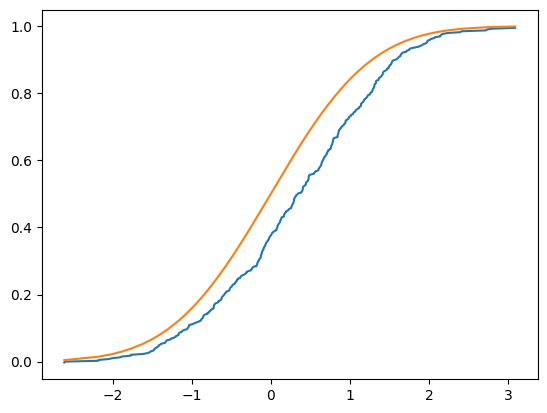

In [17]:
%matplotlib inline
from matplotlib import pyplot as plt

pvals_to_zscores, empirical_cdf, theoretical_cdf = get_cdf_plotvals([x[2] for x in event_metadata_list])
plt.plot(pvals_to_zscores, empirical_cdf)
plt.plot(pvals_to_zscores, theoretical_cdf)
plt.show()

In [19]:
def get_iterative_metapvals(pvals):
 return np.array([(get_meta_pval(pvals[:i+1])) for i in range(len(pvals))])

metatrends_to_sim = 5000
rng = np.random.RandomState(1234)
savefile = "/content/drive/MyDrive/GCP_data/analysis/simulated_metatrends_nperm"+str(metatrends_to_sim)+".npy"
if (os.path.isfile(savefile)):
  simulated_metapvals_arr = np.load(savefile)
else:
  simulated_metapvals_arr = np.array([-np.log10(
      get_iterative_metapvals(
        np.maximum(rng.uniform(size=len(csm1_psanalysis["test"])),
                  1.0/NUM_PERMUTATIONS)
      ) )
        for i in range(metatrends_to_sim)])
  np.save(savefile, simulated_metapvals_arr)

simulated_metapvals_arr=scipy.stats.norm().ppf(1-np.power(10,-simulated_metapvals_arr))

In [29]:
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import patches as mpatches
from IPython.core.display import Image, display

#plot how the meta pvalue changes with samples

min_meta = 1 # start the x axis here, min num to include in metaanalysis
max_meta = len(csm1_psanalysis["test"]) #where to stop the plot

def make_meta_trend_plot(title, test_pvals, control1_pvals, control2_pvals,
                                            control3_pvals, control4_pvals,
                                            control5_pvals, control6_pvals, savefilename):
  %matplotlib inline

  xaxis_slice = list(range(min_meta,max_meta+1))
  xaxis_full = list(range(1,max_meta+1))

  #floor p values at the lowest detectable
  test_pvals, control1_pvals, control2_pvals, control3_pvals, control4_pvals, control5_pvals, control6_pvals = [
      np.minimum(np.maximum(arr, 1.0/NUM_PERMUTATIONS), 1-(1.0/NUM_PERMUTATIONS)) for arr in
       [test_pvals, control1_pvals, control2_pvals, control3_pvals, control4_pvals, control5_pvals, control6_pvals]]

  test_pvalzs = scipy.stats.norm().ppf(1-test_pvals)
  control1_pvalzs = scipy.stats.norm().ppf(1-control1_pvals)
  control2_pvalzs = scipy.stats.norm().ppf(1-control2_pvals)
  control3_pvalzs = scipy.stats.norm().ppf(1-control3_pvals)
  control4_pvalzs = scipy.stats.norm().ppf(1-control4_pvals)
  control5_pvalzs = scipy.stats.norm().ppf(1-control5_pvals)
  control6_pvalzs = scipy.stats.norm().ppf(1-control6_pvals)

  test_metapvalzs = scipy.stats.norm().ppf(1-get_iterative_metapvals(test_pvals))
  control1_metapvalzs = scipy.stats.norm().ppf(1-get_iterative_metapvals(control1_pvals))
  control2_metapvalzs = scipy.stats.norm().ppf(1-get_iterative_metapvals(control2_pvals))
  control3_metapvalzs = scipy.stats.norm().ppf(1-get_iterative_metapvals(control3_pvals))
  control4_metapvalzs = scipy.stats.norm().ppf(1-get_iterative_metapvals(control4_pvals))
  control5_metapvalzs = scipy.stats.norm().ppf(1-get_iterative_metapvals(control5_pvals))
  control6_metapvalzs = scipy.stats.norm().ppf(1-get_iterative_metapvals(control6_pvals))

  theslice = slice(min_meta-1, max_meta)

  handles = []

  rng = np.random.RandomState(1234)

  maxsimmetapvalz_arr = np.max(simulated_metapvals_arr[:,theslice], axis=1)
  maxtestmetapvalz = np.max(test_metapvalzs[theslice])
  maxcontrol1metapvalz = np.max(control1_metapvalzs[theslice])
  maxcontrol2metapvalz = np.max(control2_metapvalzs[theslice])
  maxcontrol3metapvalz = np.max(control3_metapvalzs[theslice])
  maxcontrol4metapvalz = np.max(control4_metapvalzs[theslice])
  maxcontrol5metapvalz = np.max(control5_metapvalzs[theslice])
  maxcontrol6metapvalz = np.max(control6_metapvalzs[theslice])

  minsimmetapvalz_arr = np.min(simulated_metapvals_arr[:,theslice], axis=1)
  mintestmetapval = np.min(test_metapvalzs[theslice])
  mincontrol1metapval = np.min(control1_metapvalzs[theslice])
  mincontrol2metapval = np.min(control2_metapvalzs[theslice])
  mincontrol3metapval = np.min(control3_metapvalzs[theslice])
  mincontrol4metapval = np.min(control4_metapvalzs[theslice])
  mincontrol5metapval = np.min(control5_metapvalzs[theslice])
  mincontrol6metapval = np.min(control6_metapvalzs[theslice])

  print("Testing for positive meta-analysis z-scores:")
  print("test pval:", np.mean(maxtestmetapvalz <= maxsimmetapvalz_arr))
  print("control1 pval:", np.mean(maxcontrol1metapvalz <= maxsimmetapvalz_arr))
  print("control2 pval:", np.mean(maxcontrol2metapvalz <= maxsimmetapvalz_arr))
  print("control3 pval:", np.mean(maxcontrol3metapvalz <= maxsimmetapvalz_arr))
  print("control4 pval:", np.mean(maxcontrol4metapvalz <= maxsimmetapvalz_arr))
  print("control5 pval:", np.mean(maxcontrol5metapvalz <= maxsimmetapvalz_arr))
  print("control6 pval:", np.mean(maxcontrol6metapvalz <= maxsimmetapvalz_arr))

  print("Testing for negative meta-analysis z-scores:")
  print("test pval:", np.mean(mintestmetapval >= minsimmetapvalz_arr))
  print("control1 pval:", np.mean(mincontrol1metapval >= minsimmetapvalz_arr))
  print("control2 pval:", np.mean(mincontrol2metapval >= minsimmetapvalz_arr))
  print("control3 pval:", np.mean(mincontrol3metapval >= minsimmetapvalz_arr))
  print("control4 pval:", np.mean(mincontrol4metapval >= minsimmetapvalz_arr))
  print("control5 pval:", np.mean(mincontrol5metapval >= minsimmetapvalz_arr))
  print("control6 pval:", np.mean(mincontrol6metapval >= minsimmetapvalz_arr))

  print("Looking at correlation of test pvals with other pvals")
  print("control1:",scipy.stats.pearsonr(test_pvalzs[theslice], control1_pvalzs[theslice]))
  print("control2:",scipy.stats.pearsonr(test_pvalzs[theslice], control2_pvalzs[theslice]))
  print("control3:",scipy.stats.pearsonr(test_pvalzs[theslice], control3_pvalzs[theslice]))
  print("control4:",scipy.stats.pearsonr(test_pvalzs[theslice], control4_pvalzs[theslice]))
  print("control5:",scipy.stats.pearsonr(test_pvalzs[theslice], control5_pvalzs[theslice]))
  print("control6:",scipy.stats.pearsonr(test_pvalzs[theslice], control6_pvalzs[theslice]))

  #matplotlib.use('agg')
  fig = plt.figure(figsize=(15,4))
  #plot enveloping lines for the 95% and 5% quantiles from the maxsimmetapval_arr
  plt.plot([min_meta,max_meta], [np.percentile(maxsimmetapvalz_arr, 95)]*2, color="black", linestyle="--")
  plt.plot([min_meta,max_meta], [np.percentile(minsimmetapvalz_arr, 5)]*2, color="black", linestyle="--")
  #for simulated_metapvals in simulated_metapvals_arr:
  #  plt.plot(xaxis_slice, scipy.stats.norm().ppf(1-np.power(10,-simulated_metapvals[theslice])), color="orange", alpha=0.003)

  plt.scatter(xaxis_full, test_pvalzs[:max_meta], color="blue", s=2)
  plt.scatter(xaxis_full, control1_pvalzs[:max_meta], color="green", s=2)
  plt.scatter(xaxis_full, control2_pvalzs[:max_meta], color="red", s=2)
  plt.scatter(xaxis_full, control3_pvalzs[:max_meta], color="purple", s=2)
  plt.scatter(xaxis_full, control4_pvalzs[:max_meta], color="pink", s=2)
  plt.scatter(xaxis_full, control5_pvalzs[:max_meta], color="cyan", s=2)
  plt.scatter(xaxis_full, control6_pvalzs[:max_meta], color="orange", s=2)

  plt.plot(xaxis_slice, test_metapvalzs[theslice], color="blue")
  plt.plot(xaxis_slice, control1_metapvalzs[theslice], color="green")
  plt.plot(xaxis_slice, control2_metapvalzs[theslice], color="red")
  plt.plot(xaxis_slice, control3_metapvalzs[theslice], color="purple")
  plt.plot(xaxis_slice, control4_metapvalzs[theslice], color="pink")
  plt.plot(xaxis_slice, control5_metapvalzs[theslice], color="cyan")
  plt.plot(xaxis_slice, control6_metapvalzs[theslice], color="orange")

  plt.plot([min(xaxis_full), max(xaxis_full)],
           [0, 0],
           color="black", linestyle="--")
  plt.plot(xaxis_full, [scipy.stats.norm.ppf(1-x[2]) for x in event_metadata_list[:max_meta]], color="black")
  plt.ylim(-4,5)
  plt.xlabel("Event Number (top ranked first)")
  plt.ylabel("Z-score") #Z-score equivalent derived from inverse-normal-cdf(1-p)
  plt.title(title)
  plt.legend(handles=[mpatches.Patch(color='blue', label='Test signal'),
                      mpatches.Patch(color='black', label='Original event Z-scores'),
                      mpatches.Patch(color='green', label='Control 1 signals (1x before)'),
                      mpatches.Patch(color='red', label='Control 2 signals (1x after)'),
                      mpatches.Patch(color='purple', label='Control 3 signals (2x before)'),
                      mpatches.Patch(color='pink', label='Control 4 signals (2x after)'),
                      mpatches.Patch(color='cyan', label='Control 5 signals (3x before)'),
                      mpatches.Patch(color='orange', label='Control 6 signals (3x after)'),
                      #mpatches.Patch(color='orange', label='Null distribution ('+str(metatrends_to_sim)+' simulated)'),

                    ],
             loc="upper left", ncol=4)
  #fig.savefig("analysis/metapval_"+savefilename+'.png')
  #plt.close(fig)
  #plt.clf()
  plt.show()

print("num permutations:",NUM_PERMUTATIONS)

num permutations: 1000


csm1
csm1 nperseg-NA_maxautocorr
Testing for positive meta-analysis z-scores:
test pval: 0.1896
control1 pval: 0.064
control2 pval: 0.6646
control3 pval: 0.3976
control4 pval: 0.2382
control5 pval: 0.4896
control6 pval: 0.0906
Testing for negative meta-analysis z-scores:
test pval: 0.332
control1 pval: 0.2354
control2 pval: 0.1522
control3 pval: 0.7892
control4 pval: 0.5564
control5 pval: 0.5492
control6 pval: 0.9264
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.05707646926162964, pvalue=0.2589766680652518)
control2: PearsonRResult(statistic=0.057735289000304765, pvalue=0.25351038350906996)
control3: PearsonRResult(statistic=-0.09653818955756703, pvalue=0.05585474259600184)
control4: PearsonRResult(statistic=-0.006824963776426119, pvalue=0.8927144754531214)
control5: PearsonRResult(statistic=0.0695776042252837, pvalue=0.16863674735704212)
control6: PearsonRResult(statistic=-0.08429203851063764, pvalue=0.09518227482935161)


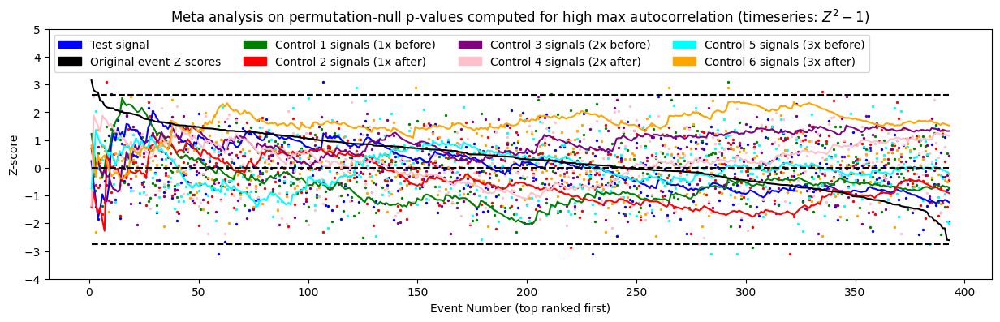

csm1 nperseg-60min_maxautocorr
Testing for positive meta-analysis z-scores:
test pval: 0.4232
control1 pval: 0.2468
control2 pval: 0.6376
control3 pval: 0.0848
control4 pval: 0.3944
control5 pval: 0.0416
control6 pval: 0.4064
Testing for negative meta-analysis z-scores:
test pval: 0.8782
control1 pval: 0.7592
control2 pval: 0.3572
control3 pval: 0.9018
control4 pval: 0.8128
control5 pval: 0.8898
control6 pval: 0.7012
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.04566078821213623, pvalue=0.36664401049507245)
control2: PearsonRResult(statistic=0.03735159409103886, pvalue=0.4602923338702995)
control3: PearsonRResult(statistic=-0.02956694552619852, pvalue=0.5589494876719325)
control4: PearsonRResult(statistic=-0.03134674881509679, pvalue=0.535522533907232)
control5: PearsonRResult(statistic=-0.048804710048105285, pvalue=0.3345403105491492)
control6: PearsonRResult(statistic=0.022263016168861033, pvalue=0.6599401462204026)


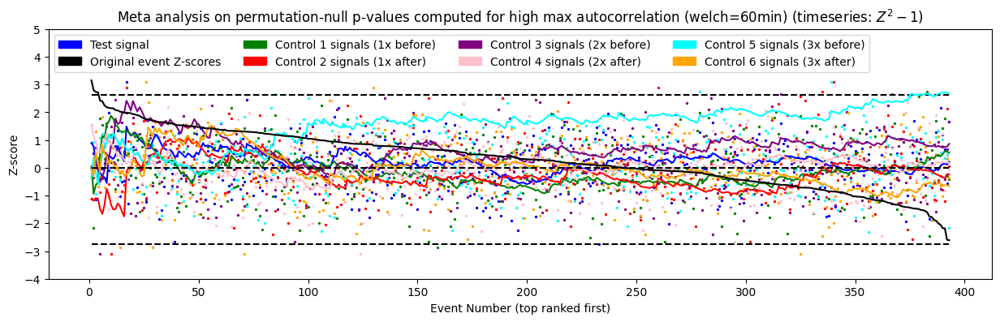

csm1 nperseg-30min_maxautocorr
Testing for positive meta-analysis z-scores:
test pval: 0.4418
control1 pval: 0.1786
control2 pval: 0.6582
control3 pval: 0.214
control4 pval: 0.606
control5 pval: 0.6424
control6 pval: 0.19
Testing for negative meta-analysis z-scores:
test pval: 0.4128
control1 pval: 0.7926
control2 pval: 0.115
control3 pval: 0.4202
control4 pval: 0.0482
control5 pval: 0.7778
control6 pval: 0.9174
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.009414918827060269, pvalue=0.8524031228025468)
control2: PearsonRResult(statistic=-0.06081424645873072, pvalue=0.2290270759936785)
control3: PearsonRResult(statistic=-0.09105535551139653, pvalue=0.07137258373786286)
control4: PearsonRResult(statistic=-0.008649262714924796, pvalue=0.8642851149873311)
control5: PearsonRResult(statistic=0.10225227987056151, pvalue=0.042772113141665964)
control6: PearsonRResult(statistic=-0.03991127261476569, pvalue=0.4301094903550389)


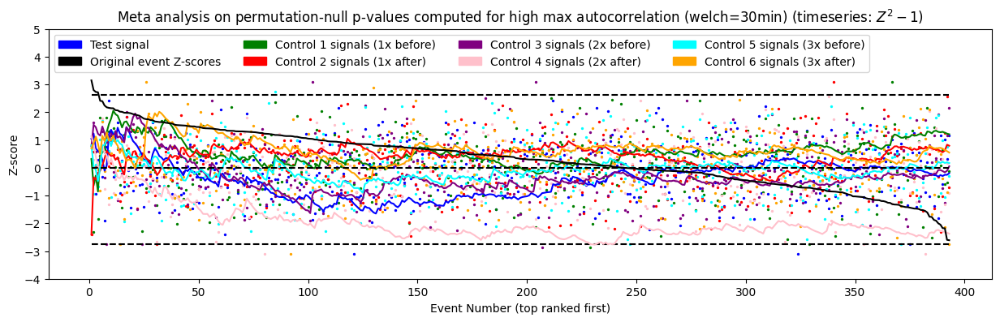

csm1 nperseg-NA_ef
Testing for positive meta-analysis z-scores:
test pval: 0.0698
control1 pval: 0.6498
control2 pval: 0.1906
control3 pval: 0.6352
control4 pval: 0.4552
control5 pval: 0.625
control6 pval: 0.3106
Testing for negative meta-analysis z-scores:
test pval: 0.7674
control1 pval: 0.1816
control2 pval: 0.423
control3 pval: 0.1608
control4 pval: 0.1526
control5 pval: 0.7582
control6 pval: 0.1158
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.056468787869817634, pvalue=0.2640902927111328)
control2: PearsonRResult(statistic=-0.0688960781271366, pvalue=0.17285695534624582)
control3: PearsonRResult(statistic=0.049944188921761105, pvalue=0.32336446422381593)
control4: PearsonRResult(statistic=-0.0032963171507894703, pvalue=0.9480633551029671)
control5: PearsonRResult(statistic=0.02214557339523035, pvalue=0.6616225113930851)
control6: PearsonRResult(statistic=-0.02096291597012404, pvalue=0.6786577751278015)


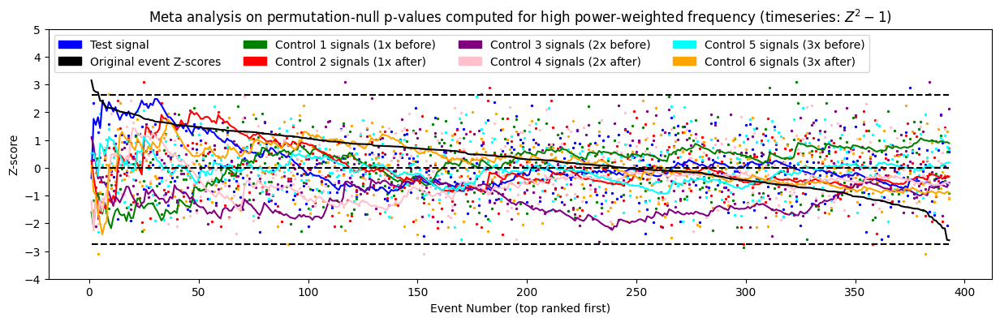

csm1 nperseg-60min_ef
Testing for positive meta-analysis z-scores:
test pval: 0.022
control1 pval: 0.7492
control2 pval: 0.2706
control3 pval: 0.6404
control4 pval: 0.528
control5 pval: 0.5036
control6 pval: 0.2144
Testing for negative meta-analysis z-scores:
test pval: 0.858
control1 pval: 0.1716
control2 pval: 0.3638
control3 pval: 0.2024
control4 pval: 0.2096
control5 pval: 0.817
control6 pval: 0.139
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.04889875635213364, pvalue=0.33360863663953855)
control2: PearsonRResult(statistic=-0.06528660059072597, pvalue=0.1965261885723252)
control3: PearsonRResult(statistic=0.05471739745909817, pvalue=0.27921443106103555)
control4: PearsonRResult(statistic=-0.0018011266749414327, pvalue=0.971607496873273)
control5: PearsonRResult(statistic=0.03028245381466395, pvalue=0.5494721338718802)
control6: PearsonRResult(statistic=-0.009948961640272315, pvalue=0.8441350120280836)


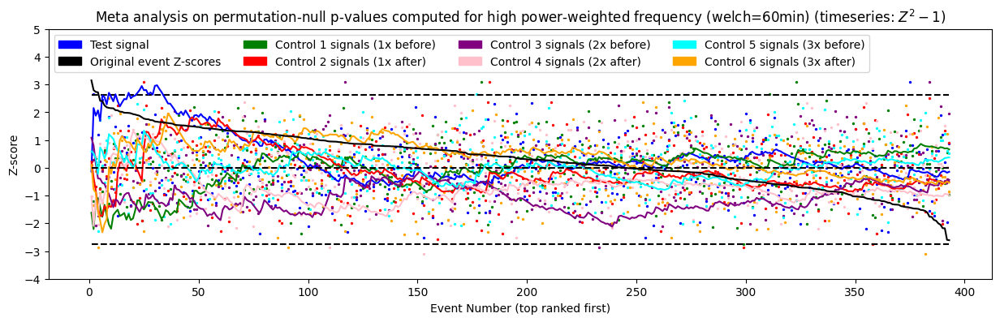

csm1 nperseg-30min_ef
Testing for positive meta-analysis z-scores:
test pval: 0.0538
control1 pval: 0.6988
control2 pval: 0.2494
control3 pval: 0.6284
control4 pval: 0.5756
control5 pval: 0.5952
control6 pval: 0.3374
Testing for negative meta-analysis z-scores:
test pval: 0.8198
control1 pval: 0.1616
control2 pval: 0.3908
control3 pval: 0.2354
control4 pval: 0.1276
control5 pval: 0.8022
control6 pval: 0.1308
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.04520229379027877, pvalue=0.3714807821523292)
control2: PearsonRResult(statistic=-0.07184324921594568, pvalue=0.1551604947442824)
control3: PearsonRResult(statistic=0.06673513509046405, pvalue=0.1867580477155314)
control4: PearsonRResult(statistic=-0.014647206620692842, pvalue=0.7722292592849492)
control5: PearsonRResult(statistic=0.039397984121463364, pvalue=0.4360685590076929)
control6: PearsonRResult(statistic=-0.030833892546328467, pvalue=0.5422222458739689)


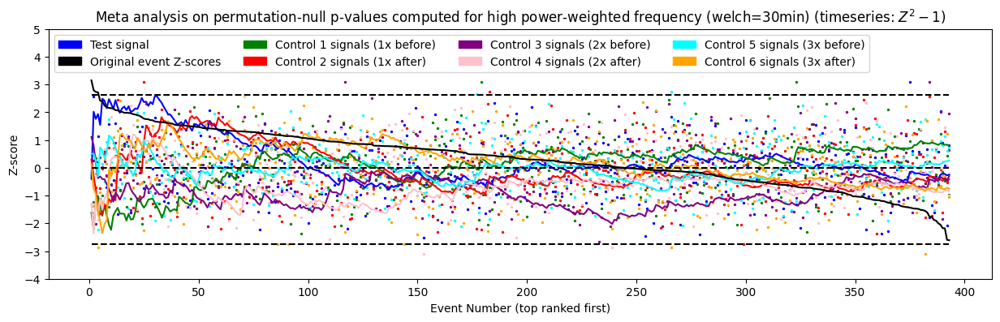

csm1 nperseg-NA_maxd
Testing for positive meta-analysis z-scores:
test pval: 0.2158
control1 pval: 0.4268
control2 pval: 0.1868
control3 pval: 0.4236
control4 pval: 0.4044
control5 pval: 0.701
control6 pval: 0.3886
Testing for negative meta-analysis z-scores:
test pval: 0.808
control1 pval: 0.8888
control2 pval: 0.5072
control3 pval: 0.284
control4 pval: 0.9736
control5 pval: 0.0192
control6 pval: 0.7106
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.07574915200031229, pvalue=0.1338633744673285)
control2: PearsonRResult(statistic=0.11109099199557014, pvalue=0.027658365788176993)
control3: PearsonRResult(statistic=0.04354876855155464, pvalue=0.3892494635878249)
control4: PearsonRResult(statistic=-0.04933297512150258, pvalue=0.3293286770743976)
control5: PearsonRResult(statistic=0.05879634690542219, pvalue=0.2448759095580395)
control6: PearsonRResult(statistic=0.009130753467211386, pvalue=0.8568092579539135)


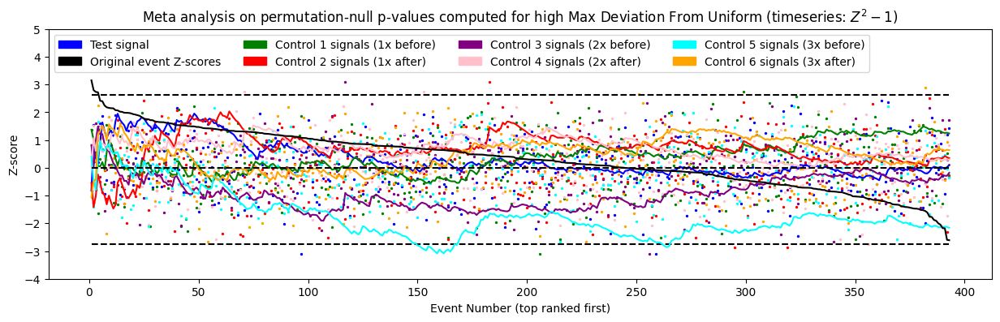

csm1 nperseg-60min_maxd
Testing for positive meta-analysis z-scores:
test pval: 0.1848
control1 pval: 0.3684
control2 pval: 0.0998
control3 pval: 0.4024
control4 pval: 0.4866
control5 pval: 0.7352
control6 pval: 0.4184
Testing for negative meta-analysis z-scores:
test pval: 0.7144
control1 pval: 0.9452
control2 pval: 0.4836
control3 pval: 0.1836
control4 pval: 0.9524
control5 pval: 0.0262
control6 pval: 0.7892
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.11137261749762958, pvalue=0.027264093681594187)
control2: PearsonRResult(statistic=0.07935686152262283, pvalue=0.11626274787560727)
control3: PearsonRResult(statistic=0.03259944487074951, pvalue=0.5193345248542383)
control4: PearsonRResult(statistic=-0.08363272033692355, pvalue=0.09780802712148816)
control5: PearsonRResult(statistic=0.020008402876627085, pvalue=0.6925275959004512)
control6: PearsonRResult(statistic=0.03040615146983397, pvalue=0.5478417192433195)


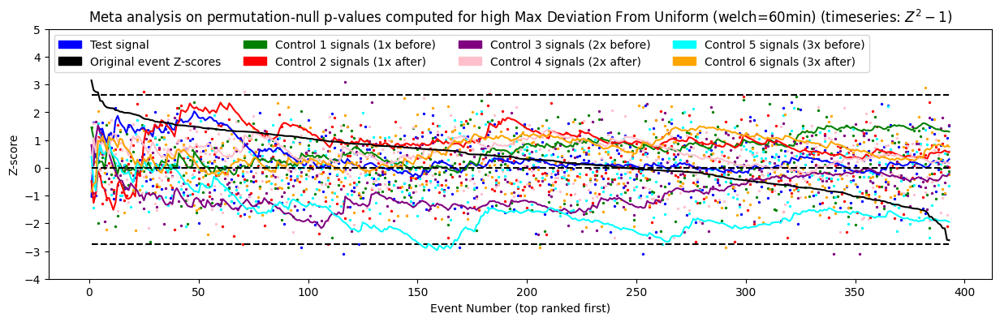

csm1 nperseg-30min_maxd
Testing for positive meta-analysis z-scores:
test pval: 0.1848
control1 pval: 0.3614
control2 pval: 0.1486
control3 pval: 0.4452
control4 pval: 0.4852
control5 pval: 0.8408
control6 pval: 0.4536
Testing for negative meta-analysis z-scores:
test pval: 0.7018
control1 pval: 0.9154
control2 pval: 0.5976
control3 pval: 0.3276
control4 pval: 0.9754
control5 pval: 0.0218
control6 pval: 0.7766
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.1018674490250291, pvalue=0.04356379145493548)
control2: PearsonRResult(statistic=0.09974173177322977, pvalue=0.0481622329634109)
control3: PearsonRResult(statistic=0.0166298974284398, pvalue=0.7424221573485771)
control4: PearsonRResult(statistic=-0.07175350875900559, pvalue=0.15567830181040687)
control5: PearsonRResult(statistic=0.024460864727478486, pvalue=0.6287794683616665)
control6: PearsonRResult(statistic=0.011739872112360623, pvalue=0.8165375796544474)


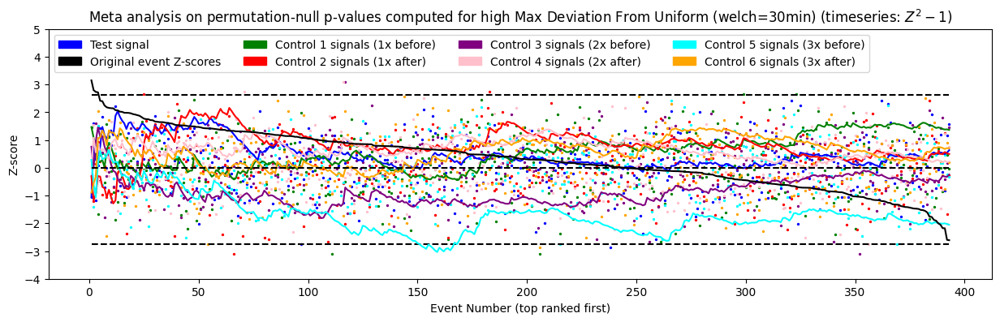

csm1 nperseg-NA_smooth-p0075_max
Testing for positive meta-analysis z-scores:
test pval: 0.1588
control1 pval: 0.9988
control2 pval: 0.5136
control3 pval: 0.4502
control4 pval: 0.895
control5 pval: 0.9282
control6 pval: 0.9348
Testing for negative meta-analysis z-scores:
test pval: 0.7932
control1 pval: 0.0028
control2 pval: 0.7236
control3 pval: 0.2036
control4 pval: 0.0312
control5 pval: 0.1096
control6 pval: 0.0378
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.01078501532453147, pvalue=0.8312257527637903)
control2: PearsonRResult(statistic=-0.09118568815382422, pvalue=0.0709665857114413)
control3: PearsonRResult(statistic=-0.07706967583123438, pvalue=0.12719689904681625)
control4: PearsonRResult(statistic=0.046374699804142265, pvalue=0.35919106648754834)
control5: PearsonRResult(statistic=-0.0447609493487016, pvalue=0.3761736936343345)
control6: PearsonRResult(statistic=0.03823907291838008, pvalue=0.44969600807043836)


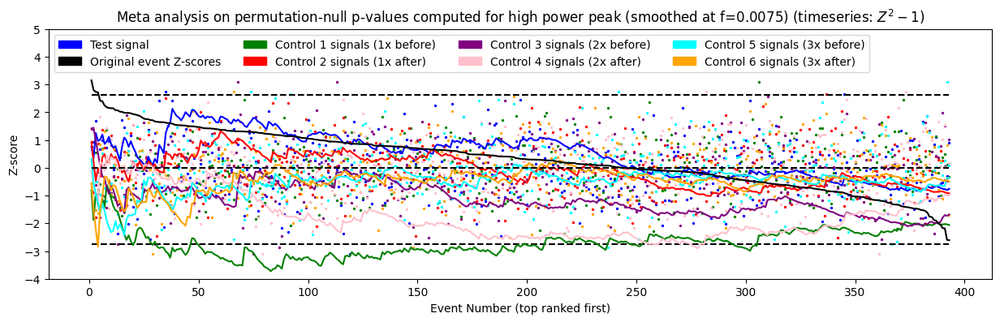

csm1 nperseg-60min_smooth-p0075_max
Testing for positive meta-analysis z-scores:
test pval: 0.3474
control1 pval: 0.9798
control2 pval: 0.4498
control3 pval: 0.2528
control4 pval: 0.5988
control5 pval: 0.9224
control6 pval: 0.8592
Testing for negative meta-analysis z-scores:
test pval: 0.6214
control1 pval: 0.0072
control2 pval: 0.7066
control3 pval: 0.1854
control4 pval: 0.1034
control5 pval: 0.0236
control6 pval: 0.2228
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.009328594058081927, pvalue=0.853741155719852)
control2: PearsonRResult(statistic=-0.031188061358798185, pvalue=0.5375911049163145)
control3: PearsonRResult(statistic=-0.0011719252441798568, pvalue=0.9815238279129255)
control4: PearsonRResult(statistic=0.07650673195417361, pvalue=0.13000667450707823)
control5: PearsonRResult(statistic=0.012829698476918366, pvalue=0.7998516149302605)
control6: PearsonRResult(statistic=0.044084931731025, pvalue=0.3834322437187006)


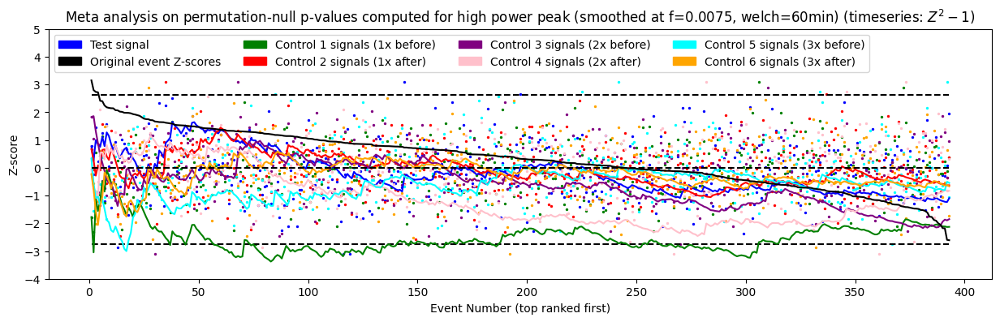

csm1 nperseg-30min_smooth-p0075_max
Testing for positive meta-analysis z-scores:
test pval: 0.4484
control1 pval: 0.9962
control2 pval: 0.606
control3 pval: 0.5148
control4 pval: 0.6336
control5 pval: 0.916
control6 pval: 0.9314
Testing for negative meta-analysis z-scores:
test pval: 0.6748
control1 pval: 0.0028
control2 pval: 0.474
control3 pval: 0.239
control4 pval: 0.0152
control5 pval: 0.135
control6 pval: 0.147
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.01915705130469187, pvalue=0.7049858220427685)
control2: PearsonRResult(statistic=-0.049170303755697996, pvalue=0.33092790868017896)
control3: PearsonRResult(statistic=-0.04976094217793128, pvalue=0.3251451757441054)
control4: PearsonRResult(statistic=0.10570953820407836, pvalue=0.03618812670829684)
control5: PearsonRResult(statistic=-0.010264157679466372, pvalue=0.8392630668997223)
control6: PearsonRResult(statistic=0.017066035492018745, pvalue=0.7359149757034524)


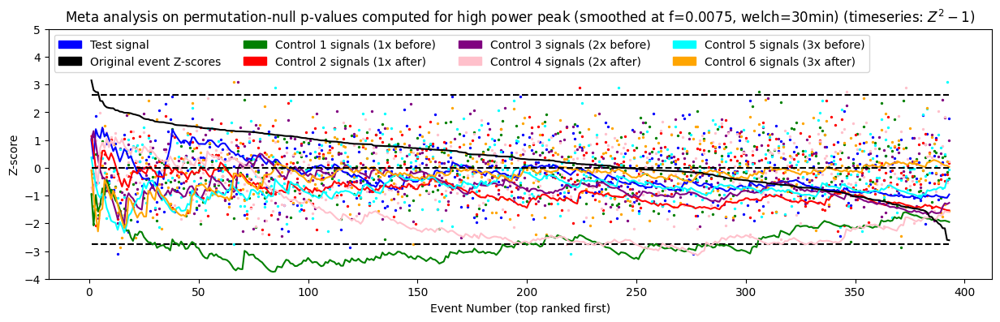

csm1 nperseg-NA_smooth-p0075_min
Testing for positive meta-analysis z-scores:
test pval: 0.876
control1 pval: 0.353
control2 pval: 0.2336
control3 pval: 0.3294
control4 pval: 0.8608
control5 pval: 0.564
control6 pval: 0.9236
Testing for negative meta-analysis z-scores:
test pval: 0.7036
control1 pval: 0.575
control2 pval: 0.808
control3 pval: 0.699
control4 pval: 0.122
control5 pval: 0.8558
control6 pval: 0.3144
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.004339832679090169, pvalue=0.9316570546093392)
control2: PearsonRResult(statistic=-0.08769431959158326, pvalue=0.08251417741513509)
control3: PearsonRResult(statistic=0.03972081067896731, pvalue=0.43231515973837753)
control4: PearsonRResult(statistic=-0.003952192359680883, pvalue=0.9377485881957754)
control5: PearsonRResult(statistic=-0.07896710921213555, pvalue=0.11807213847482784)
control6: PearsonRResult(statistic=0.060716167535574087, pvalue=0.2297801719218914)


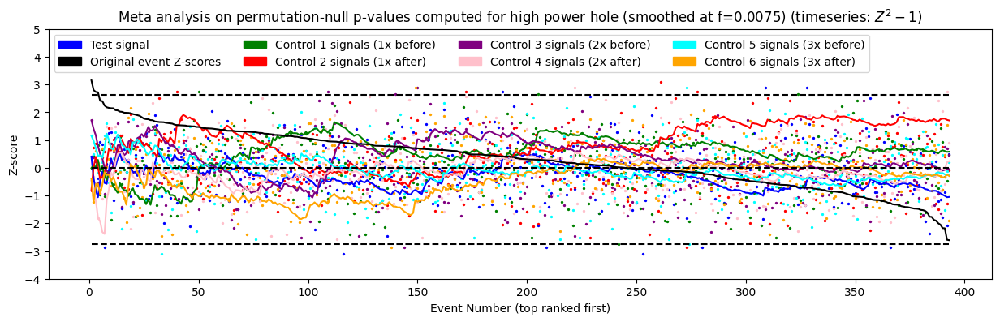

csm1 nperseg-60min_smooth-p0075_min
Testing for positive meta-analysis z-scores:
test pval: 0.5746
control1 pval: 0.253
control2 pval: 0.0936
control3 pval: 0.3346
control4 pval: 0.8398
control5 pval: 0.4654
control6 pval: 0.7958
Testing for negative meta-analysis z-scores:
test pval: 0.7802
control1 pval: 0.7222
control2 pval: 0.9084
control3 pval: 0.8896
control4 pval: 0.3942
control5 pval: 0.9172
control6 pval: 0.4636
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.07968510471515332, pvalue=0.11475580622051701)
control2: PearsonRResult(statistic=-0.038674660780990265, pvalue=0.4445460011751979)
control3: PearsonRResult(statistic=-0.022136392627778056, pvalue=0.6617540975819022)
control4: PearsonRResult(statistic=-0.030992402874813585, pvalue=0.5401471034713315)
control5: PearsonRResult(statistic=-0.08857208513892179, pvalue=0.07947707590825931)
control6: PearsonRResult(statistic=0.04017396207473282, pvalue=0.42707808555213544)


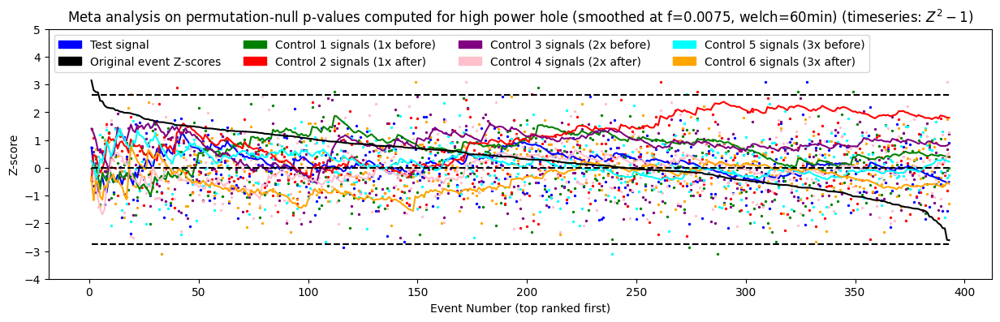

csm1 nperseg-30min_smooth-p0075_min
Testing for positive meta-analysis z-scores:
test pval: 0.6912
control1 pval: 0.3408
control2 pval: 0.0528
control3 pval: 0.3684
control4 pval: 0.5436
control5 pval: 0.68
control6 pval: 0.9784
Testing for negative meta-analysis z-scores:
test pval: 0.8726
control1 pval: 0.3134
control2 pval: 0.8044
control3 pval: 0.851
control4 pval: 0.7034
control5 pval: 0.7318
control6 pval: 0.1054
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.003291087798596582, pvalue=0.9481456328274078)
control2: PearsonRResult(statistic=-0.017123540444132165, pvalue=0.7350583965957964)
control3: PearsonRResult(statistic=0.029561995347837367, pvalue=0.559015330337824)
control4: PearsonRResult(statistic=-0.0874046649783785, pvalue=0.08353671884703419)
control5: PearsonRResult(statistic=-0.08727455788966854, pvalue=0.08399933939991554)
control6: PearsonRResult(statistic=0.04114447099122165, pvalue=0.4159866320948204)


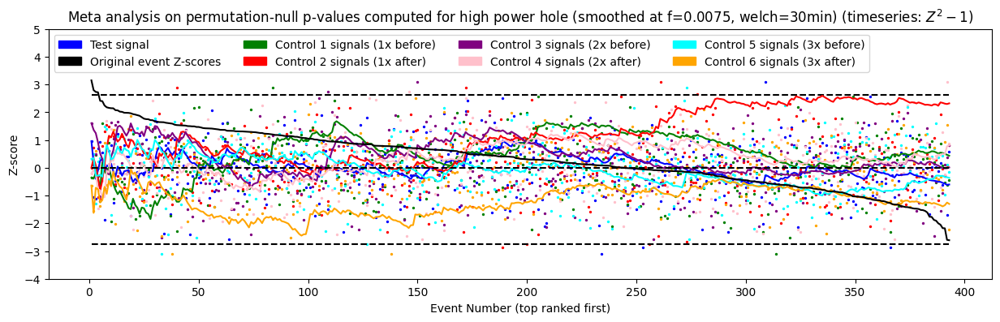

csm1 nperseg-NA_smooth-p01_max
Testing for positive meta-analysis z-scores:
test pval: 0.0354
control1 pval: 0.9236
control2 pval: 0.7006
control3 pval: 0.369
control4 pval: 0.7238
control5 pval: 0.6512
control6 pval: 0.987
Testing for negative meta-analysis z-scores:
test pval: 0.9568
control1 pval: 0.0496
control2 pval: 0.4478
control3 pval: 0.3628
control4 pval: 0.0092
control5 pval: 0.1498
control6 pval: 0.0804
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.03886239492728386, pvalue=0.4423367774357492)
control2: PearsonRResult(statistic=-0.07427643358145732, pvalue=0.1416122562954677)
control3: PearsonRResult(statistic=0.03872072314705568, pvalue=0.444003367194203)
control4: PearsonRResult(statistic=0.07691520152842471, pvalue=0.12796318578055266)
control5: PearsonRResult(statistic=0.003925413413705473, pvalue=0.938169541319336)
control6: PearsonRResult(statistic=0.012005427565564046, pvalue=0.8124637978925148)


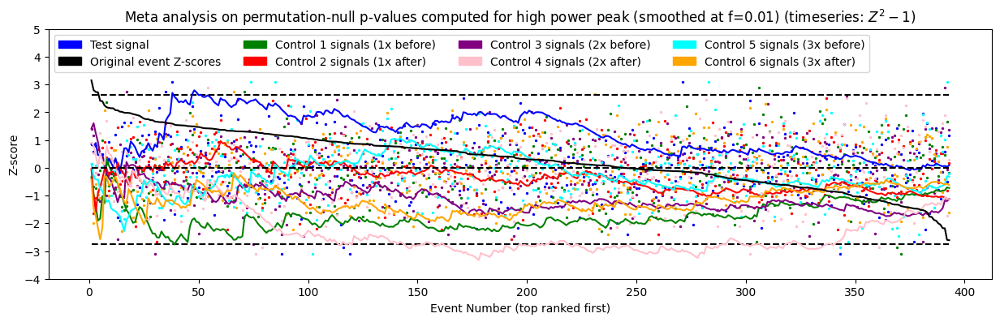

csm1 nperseg-60min_smooth-p01_max
Testing for positive meta-analysis z-scores:
test pval: 0.0256
control1 pval: 0.7984
control2 pval: 0.5642
control3 pval: 0.2394
control4 pval: 0.6326
control5 pval: 0.862
control6 pval: 0.9474
Testing for negative meta-analysis z-scores:
test pval: 0.928
control1 pval: 0.0598
control2 pval: 0.4572
control3 pval: 0.5008
control4 pval: 0.0304
control5 pval: 0.0232
control6 pval: 0.363
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.04731385098958394, pvalue=0.34953230894023)
control2: PearsonRResult(statistic=-0.06380957016069583, pvalue=0.2068650543458964)
control3: PearsonRResult(statistic=0.035825164700671285, pvalue=0.4788388633103379)
control4: PearsonRResult(statistic=0.10411847180727167, pvalue=0.03910275980758412)
control5: PearsonRResult(statistic=0.0348254280475658, pvalue=0.4912028472838575)
control6: PearsonRResult(statistic=0.057059828727789356, pvalue=0.25911578131590574)


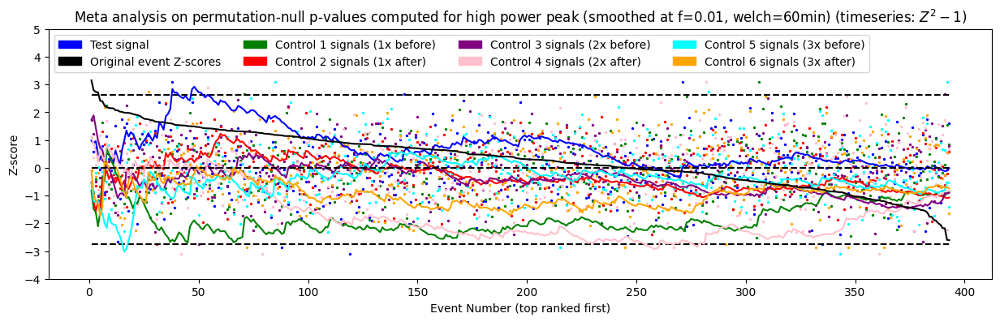

csm1 nperseg-30min_smooth-p01_max
Testing for positive meta-analysis z-scores:
test pval: 0.0154
control1 pval: 0.8638
control2 pval: 0.934
control3 pval: 0.4494
control4 pval: 0.7198
control5 pval: 0.772
control6 pval: 0.9246
Testing for negative meta-analysis z-scores:
test pval: 0.985
control1 pval: 0.1998
control2 pval: 0.4948
control3 pval: 0.5304
control4 pval: 0.0062
control5 pval: 0.022
control6 pval: 0.178
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.03241054516763946, pvalue=0.5217593785786886)
control2: PearsonRResult(statistic=-0.03694958839816274, pvalue=0.46513761371863044)
control3: PearsonRResult(statistic=0.012556559022192455, pvalue=0.8040253428581868)
control4: PearsonRResult(statistic=0.12313984109435538, pvalue=0.014578678368079348)
control5: PearsonRResult(statistic=0.02921738459390252, pvalue=0.5636082195559434)
control6: PearsonRResult(statistic=-0.003902539502810846, pvalue=0.9385291226638384)


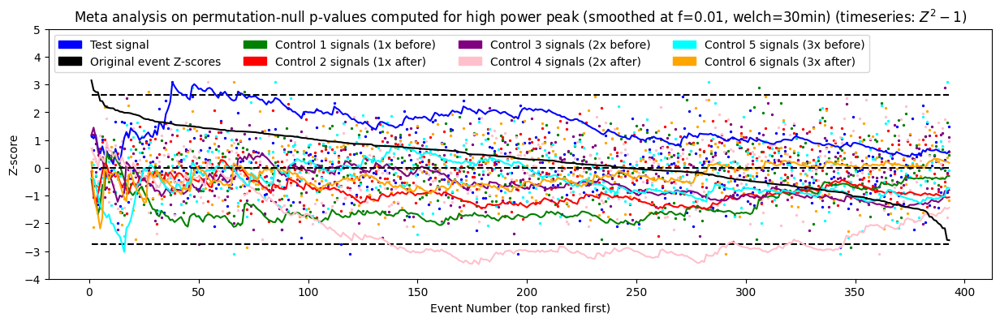

csm1 nperseg-NA_smooth-p01_min
Testing for positive meta-analysis z-scores:
test pval: 0.3152
control1 pval: 0.4858
control2 pval: 0.2916
control3 pval: 0.1988
control4 pval: 0.4928
control5 pval: 0.4566
control6 pval: 0.566
Testing for negative meta-analysis z-scores:
test pval: 0.7818
control1 pval: 0.9004
control2 pval: 0.975
control3 pval: 0.8542
control4 pval: 0.6358
control5 pval: 0.5952
control6 pval: 0.148
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.021307489073202852, pvalue=0.6736770748291556)
control2: PearsonRResult(statistic=-0.11345050358381062, pvalue=0.024501633341796336)
control3: PearsonRResult(statistic=0.035389986498578024, pvalue=0.4841999081944622)
control4: PearsonRResult(statistic=0.0010215249362278914, pvalue=0.9838946432251362)
control5: PearsonRResult(statistic=-0.12087051487326436, pvalue=0.016515152582271275)
control6: PearsonRResult(statistic=0.010849492170649611, pvalue=0.8302320195182813)


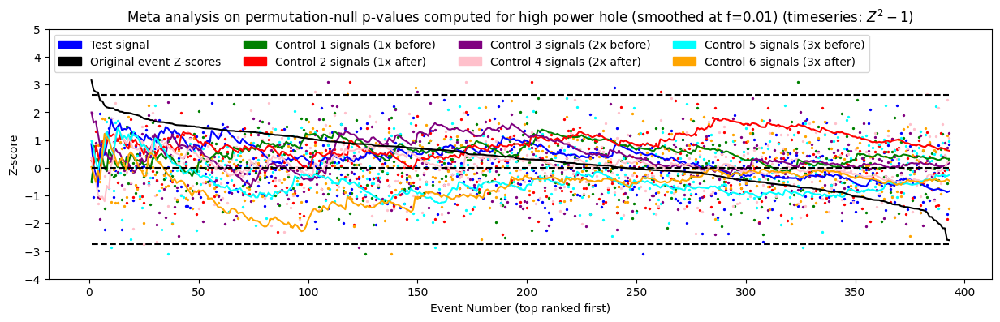

csm1 nperseg-60min_smooth-p01_min
Testing for positive meta-analysis z-scores:
test pval: 0.3756
control1 pval: 0.4624
control2 pval: 0.1578
control3 pval: 0.2554
control4 pval: 0.4042
control5 pval: 0.405
control6 pval: 0.8826
Testing for negative meta-analysis z-scores:
test pval: 0.8594
control1 pval: 0.9246
control2 pval: 0.9456
control3 pval: 0.609
control4 pval: 0.6344
control5 pval: 0.7696
control6 pval: 0.1056
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.06776142545161296, pvalue=0.18005676866967021)
control2: PearsonRResult(statistic=-0.026808886733422244, pvalue=0.5962035740606767)
control3: PearsonRResult(statistic=0.05840921997063186, pvalue=0.24800206173072217)
control4: PearsonRResult(statistic=-0.07489977220914489, pvalue=0.13829159006320144)
control5: PearsonRResult(statistic=-0.12597214017361383, pvalue=0.012443560133035667)
control6: PearsonRResult(statistic=-0.025405963471783925, pvalue=0.6155758255511572)


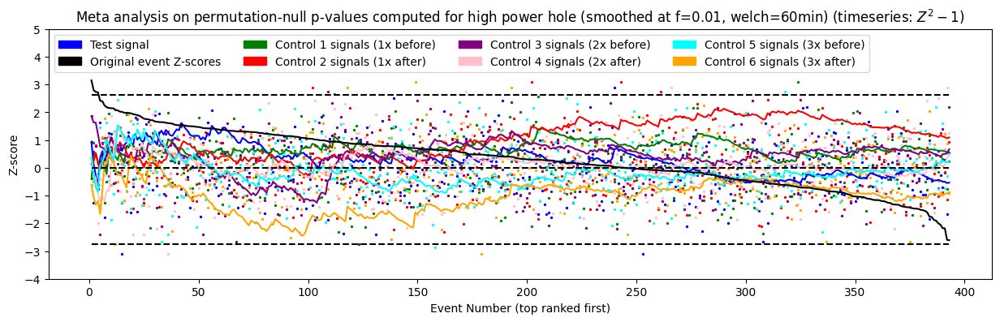

csm1 nperseg-30min_smooth-p01_min
Testing for positive meta-analysis z-scores:
test pval: 0.4448
control1 pval: 0.2658
control2 pval: 0.0548
control3 pval: 0.105
control4 pval: 0.3374
control5 pval: 0.36
control6 pval: 0.9144
Testing for negative meta-analysis z-scores:
test pval: 0.665
control1 pval: 0.9272
control2 pval: 0.9898
control3 pval: 0.5496
control4 pval: 0.7078
control5 pval: 0.7742
control6 pval: 0.0334
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.043130615814202126, pvalue=0.3938232218463037)
control2: PearsonRResult(statistic=-0.0965189159963912, pvalue=0.05590394077381727)
control3: PearsonRResult(statistic=0.06399260472552042, pvalue=0.20556291863385612)
control4: PearsonRResult(statistic=-0.051099272122546294, pvalue=0.3122859237691665)
control5: PearsonRResult(statistic=-0.11826942473817446, pvalue=0.019008272350458974)
control6: PearsonRResult(statistic=0.0005941470043645683, pvalue=0.9906322621057907)


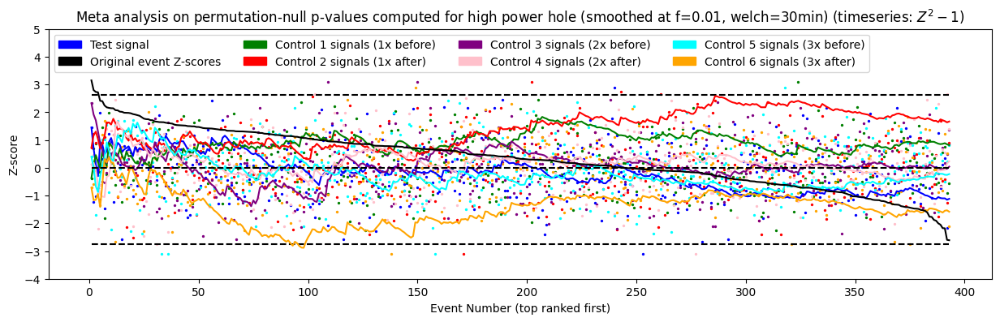

csm1 nperseg-NA_smooth-p0125_max
Testing for positive meta-analysis z-scores:
test pval: 0.0024
control1 pval: 0.9558
control2 pval: 0.5364
control3 pval: 0.4686
control4 pval: 0.6514
control5 pval: 0.3972
control6 pval: 0.9536
Testing for negative meta-analysis z-scores:
test pval: 0.9308
control1 pval: 0.0322
control2 pval: 0.712
control3 pval: 0.3516
control4 pval: 0.028
control5 pval: 0.1582
control6 pval: 0.3126
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.007215969434905785, pvalue=0.8866082988583215)
control2: PearsonRResult(statistic=0.006738946253349686, pvalue=0.8940586397250909)
control3: PearsonRResult(statistic=0.024726695393992724, pvalue=0.6250534257824484)
control4: PearsonRResult(statistic=-0.03185154317950817, pvalue=0.5289689639796091)
control5: PearsonRResult(statistic=-0.032422555743145946, pvalue=0.5216050295956581)
control6: PearsonRResult(statistic=0.008665791772469948, pvalue=0.8640282722267135)


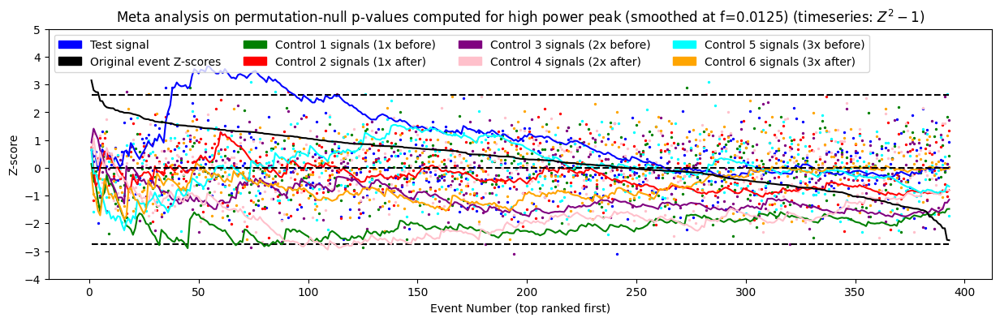

csm1 nperseg-60min_smooth-p0125_max
Testing for positive meta-analysis z-scores:
test pval: 0.0018
control1 pval: 0.9942
control2 pval: 0.317
control3 pval: 0.5028
control4 pval: 0.5986
control5 pval: 0.6456
control6 pval: 0.8454
Testing for negative meta-analysis z-scores:
test pval: 0.946
control1 pval: 0.024
control2 pval: 0.7546
control3 pval: 0.602
control4 pval: 0.1578
control5 pval: 0.0112
control6 pval: 0.4466
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.04697619003160156, pvalue=0.3529859279511142)
control2: PearsonRResult(statistic=0.03227105183860492, pvalue=0.5235537325323091)
control3: PearsonRResult(statistic=-0.016631813485444687, pvalue=0.7423935292363292)
control4: PearsonRResult(statistic=0.05461890282730787, pvalue=0.28008206576107475)
control5: PearsonRResult(statistic=0.02006987773872697, pvalue=0.6916311563708781)
control6: PearsonRResult(statistic=0.05139481770103755, pvalue=0.3094918199194949)


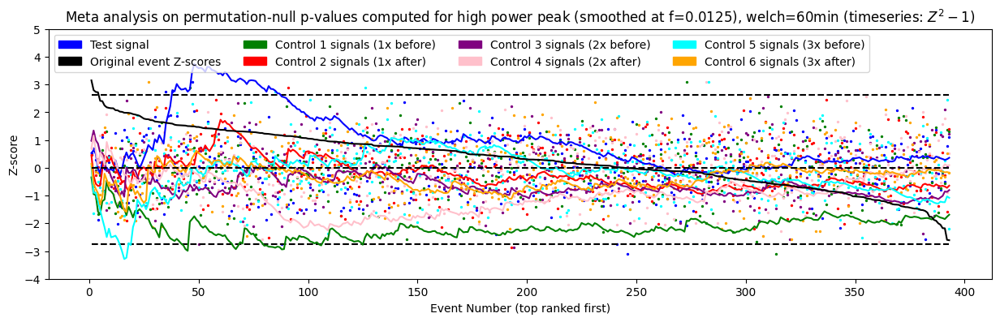

csm1 nperseg-30min_smooth-p0125_max
Testing for positive meta-analysis z-scores:
test pval: 0.007
control1 pval: 0.9192
control2 pval: 0.79
control3 pval: 0.6182
control4 pval: 0.6428
control5 pval: 0.5642
control6 pval: 0.7266
Testing for negative meta-analysis z-scores:
test pval: 0.908
control1 pval: 0.1214
control2 pval: 0.4472
control3 pval: 0.64
control4 pval: 0.127
control5 pval: 0.0584
control6 pval: 0.2994
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.03017415837455003, pvalue=0.5509014912699235)
control2: PearsonRResult(statistic=-0.024070526470925332, pvalue=0.6342677738143131)
control3: PearsonRResult(statistic=-0.014178036469082955, pvalue=0.7793337247982282)
control4: PearsonRResult(statistic=0.03465036774187717, pvalue=0.4933852991364987)
control5: PearsonRResult(statistic=-0.02127899932128388, pvalue=0.6740883492722562)
control6: PearsonRResult(statistic=0.02874864138157248, pvalue=0.5698844457097416)


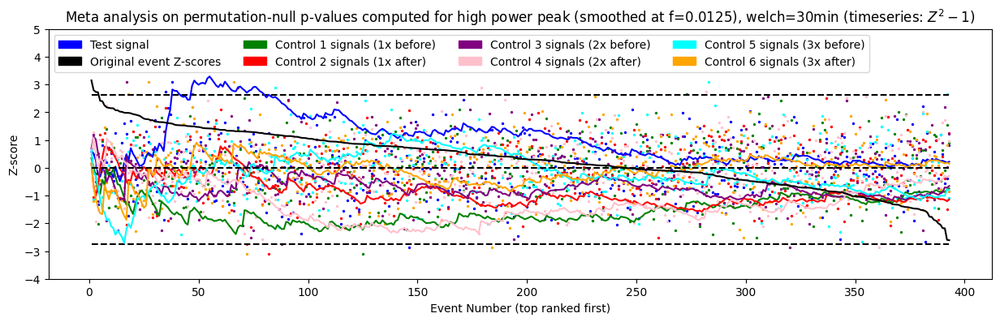

csm1 nperseg-NA_smooth-p0125_min
Testing for positive meta-analysis z-scores:
test pval: 0.4786
control1 pval: 0.8688
control2 pval: 0.4816
control3 pval: 0.2626
control4 pval: 0.4656
control5 pval: 0.375
control6 pval: 0.8336
Testing for negative meta-analysis z-scores:
test pval: 0.468
control1 pval: 0.7442
control2 pval: 0.8726
control3 pval: 0.729
control4 pval: 0.7582
control5 pval: 0.7832
control6 pval: 0.1376
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.01792853332148326, pvalue=0.7231023187559321)
control2: PearsonRResult(statistic=-0.05650363673536489, pvalue=0.26379517867775437)
control3: PearsonRResult(statistic=0.10258844469196239, pvalue=0.04209050005713682)
control4: PearsonRResult(statistic=0.014223585722785807, pvalue=0.778643173794989)
control5: PearsonRResult(statistic=-0.12314793404136658, pvalue=0.014572145509429438)
control6: PearsonRResult(statistic=-0.018109983399211528, pvalue=0.7204165025096175)


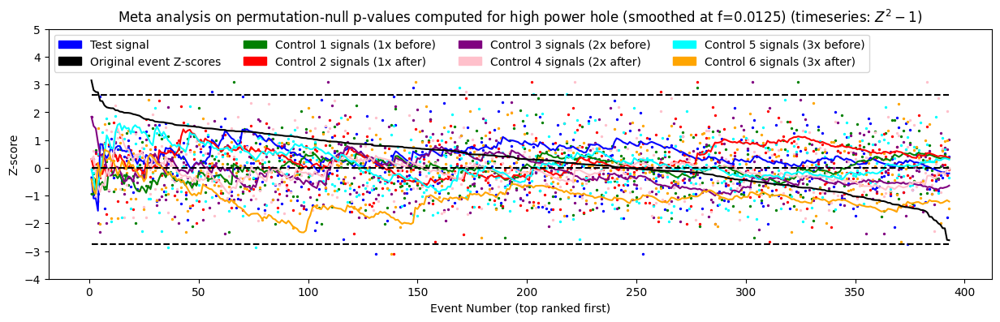

csm1 nperseg-60min_smooth-p0125_min
Testing for positive meta-analysis z-scores:
test pval: 0.633
control1 pval: 0.8086
control2 pval: 0.3596
control3 pval: 0.345
control4 pval: 0.3352
control5 pval: 0.324
control6 pval: 0.8596
Testing for negative meta-analysis z-scores:
test pval: 0.4772
control1 pval: 0.8516
control2 pval: 0.8962
control3 pval: 0.7564
control4 pval: 0.7164
control5 pval: 0.766
control6 pval: 0.0758
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.023284682350623982, pvalue=0.6453777722849747)
control2: PearsonRResult(statistic=-0.04925205102431449, pvalue=0.33012362203438544)
control3: PearsonRResult(statistic=0.08341534513955905, pvalue=0.09868625910325993)
control4: PearsonRResult(statistic=-0.02686868137064181, pvalue=0.5953840807866034)
control5: PearsonRResult(statistic=-0.1215791767279752, pvalue=0.01588757737777924)
control6: PearsonRResult(statistic=-0.035762043550864576, pvalue=0.47961445733472263)


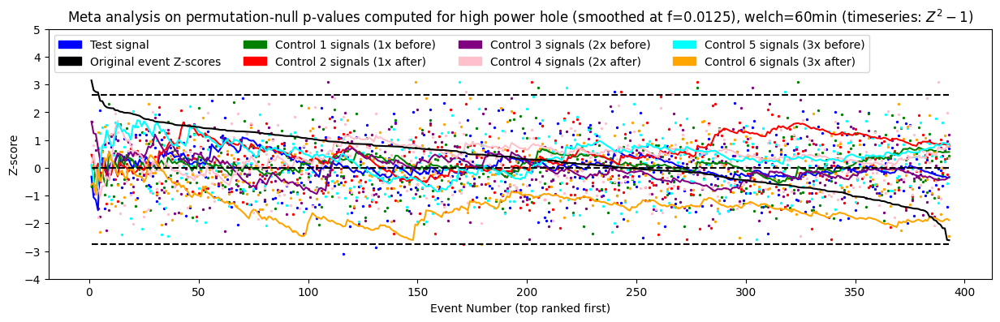

csm1 nperseg-30min_smooth-p0125_min
Testing for positive meta-analysis z-scores:
test pval: 0.7198
control1 pval: 0.7556
control2 pval: 0.355
control3 pval: 0.3736
control4 pval: 0.458
control5 pval: 0.3396
control6 pval: 0.9664
Testing for negative meta-analysis z-scores:
test pval: 0.8932
control1 pval: 0.7022
control2 pval: 0.9258
control3 pval: 0.6786
control4 pval: 0.62
control5 pval: 0.6228
control6 pval: 0.0182
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.008690617312566028, pvalue=0.8636425384586907)
control2: PearsonRResult(statistic=-0.06980159613901693, pvalue=0.16726667904314213)
control3: PearsonRResult(statistic=0.1083791232656063, pvalue=0.031712214206973066)
control4: PearsonRResult(statistic=-0.03176611929880814, pvalue=0.5300751281414613)
control5: PearsonRResult(statistic=-0.11019931872491621, pvalue=0.028939165295507264)
control6: PearsonRResult(statistic=-0.023722913832175785, pvalue=0.6391722750836394)


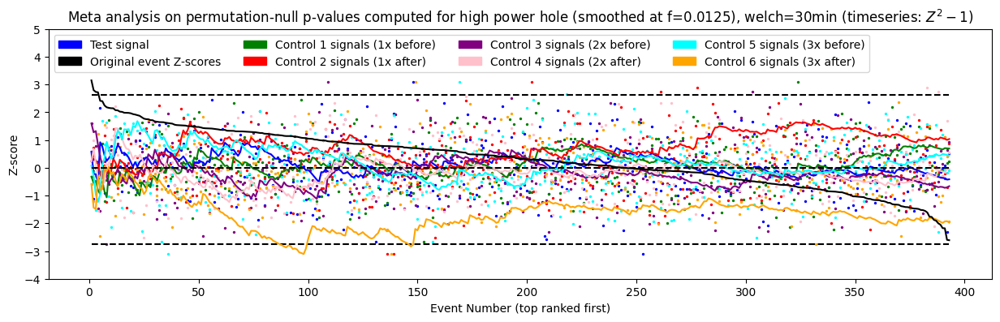

csm1 nperseg-NA_smooth-p025_max
Testing for positive meta-analysis z-scores:
test pval: 0.0304
control1 pval: 0.8238
control2 pval: 0.3526
control3 pval: 0.9092
control4 pval: 0.126
control5 pval: 0.8934
control6 pval: 0.4748
Testing for negative meta-analysis z-scores:
test pval: 0.7818
control1 pval: 0.2478
control2 pval: 0.7166
control3 pval: 0.05
control4 pval: 0.5106
control5 pval: 0.3214
control6 pval: 0.2024
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.03399541709093024, pvalue=0.5015961449792468)
control2: PearsonRResult(statistic=-0.013044382125848221, pvalue=0.7965751109308812)
control3: PearsonRResult(statistic=-0.027293754054076705, pvalue=0.5895732201323022)
control4: PearsonRResult(statistic=0.04880759948182188, pvalue=0.3345116613935839)
control5: PearsonRResult(statistic=0.0032995267698162287, pvalue=0.9480128557845886)
control6: PearsonRResult(statistic=0.06935543899120425, pvalue=0.17000391231060408)


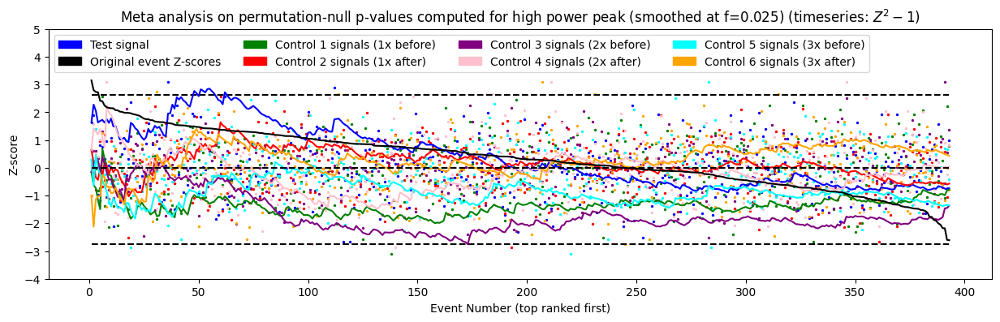

csm1 nperseg-60min_smooth-p025_max
Testing for positive meta-analysis z-scores:
test pval: 0.0486
control1 pval: 0.7332
control2 pval: 0.157
control3 pval: 0.8248
control4 pval: 0.2262
control5 pval: 0.9608
control6 pval: 0.5978
Testing for negative meta-analysis z-scores:
test pval: 0.5798
control1 pval: 0.3932
control2 pval: 0.8026
control3 pval: 0.1342
control4 pval: 0.5526
control5 pval: 0.1922
control6 pval: 0.2632
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.04465674581257306, pvalue=0.3772870089558353)
control2: PearsonRResult(statistic=0.002332775033704306, pvalue=0.9632319655372039)
control3: PearsonRResult(statistic=-0.023538608443036485, pvalue=0.641779065650023)
control4: PearsonRResult(statistic=0.06107655281820292, pvalue=0.22702156899266432)
control5: PearsonRResult(statistic=-0.012543497114095602, pvalue=0.8042250768556808)
control6: PearsonRResult(statistic=0.043052129780059255, pvalue=0.3946853013241196)


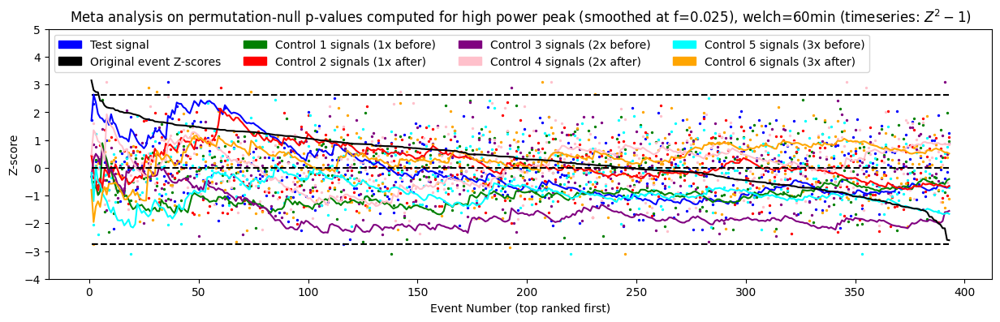

csm1 nperseg-30min_smooth-p025_max
Testing for positive meta-analysis z-scores:
test pval: 0.0422
control1 pval: 0.7966
control2 pval: 0.2706
control3 pval: 0.7908
control4 pval: 0.1926
control5 pval: 0.958
control6 pval: 0.3758
Testing for negative meta-analysis z-scores:
test pval: 0.8278
control1 pval: 0.2844
control2 pval: 0.7716
control3 pval: 0.026
control4 pval: 0.6892
control5 pval: 0.1582
control6 pval: 0.3812
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.012332974776912267, pvalue=0.8074459918619394)
control2: PearsonRResult(statistic=-0.013370244563889716, pvalue=0.7916086312348389)
control3: PearsonRResult(statistic=-0.04067118548026169, pvalue=0.42137426733331046)
control4: PearsonRResult(statistic=0.05936496071819636, pvalue=0.24033432197551452)
control5: PearsonRResult(statistic=-0.007062752160771562, pvalue=0.8890002523357724)
control6: PearsonRResult(statistic=0.0036275622602377645, pvalue=0.9428527629604332)


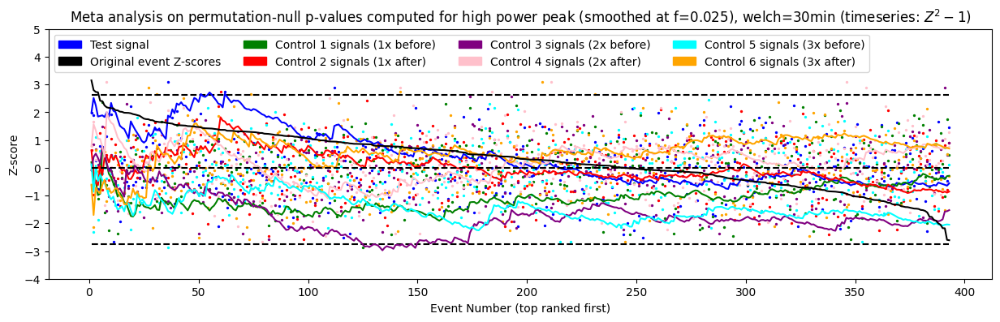

csm1 nperseg-NA_smooth-p025_min
Testing for positive meta-analysis z-scores:
test pval: 0.0396
control1 pval: 0.7242
control2 pval: 0.6066
control3 pval: 0.7172
control4 pval: 0.504
control5 pval: 0.0998
control6 pval: 0.348
Testing for negative meta-analysis z-scores:
test pval: 0.9694
control1 pval: 0.3452
control2 pval: 0.6592
control3 pval: 0.2632
control4 pval: 0.7108
control5 pval: 0.7764
control6 pval: 0.6746
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=0.004099339232714935, pvalue=0.9354358171508854)
control2: PearsonRResult(statistic=-0.02983482038426642, pvalue=0.555392071481267)
control3: PearsonRResult(statistic=0.047412821108429884, pvalue=0.3485240988808743)
control4: PearsonRResult(statistic=0.019909229987715167, pvalue=0.6939746602962156)
control5: PearsonRResult(statistic=-0.048851554910785376, pvalue=0.3340760311956719)
control6: PearsonRResult(statistic=0.016138454338847495, pvalue=0.7497765043816284)


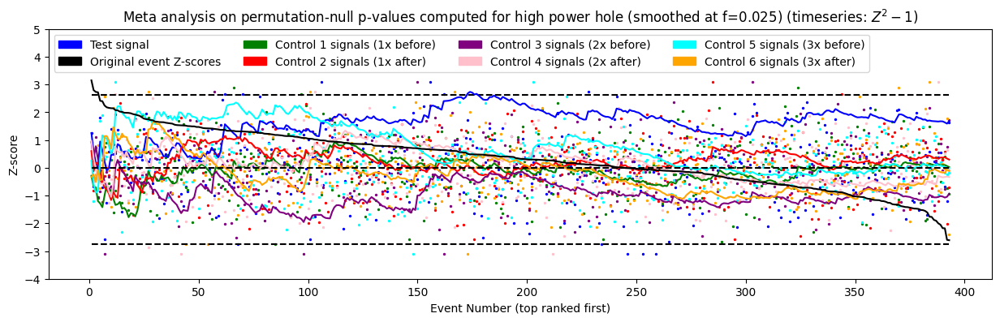

csm1 nperseg-60min_smooth-p025_min
Testing for positive meta-analysis z-scores:
test pval: 0.0552
control1 pval: 0.7966
control2 pval: 0.4628
control3 pval: 0.5454
control4 pval: 0.5136
control5 pval: 0.1296
control6 pval: 0.339
Testing for negative meta-analysis z-scores:
test pval: 0.8766
control1 pval: 0.3492
control2 pval: 0.62
control3 pval: 0.4576
control4 pval: 0.7812
control5 pval: 0.7564
control6 pval: 0.6244
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.019291896145304358, pvalue=0.7030072099683135)
control2: PearsonRResult(statistic=0.0020643891922297528, pvalue=0.9674596400462759)
control3: PearsonRResult(statistic=0.08881350236733726, pvalue=0.07865782942185291)
control4: PearsonRResult(statistic=-0.005462838607818644, pvalue=0.9140334495794326)
control5: PearsonRResult(statistic=-0.052817848933205645, pvalue=0.29626938801986635)
control6: PearsonRResult(statistic=-0.05335933182830346, pvalue=0.2913384598196566)


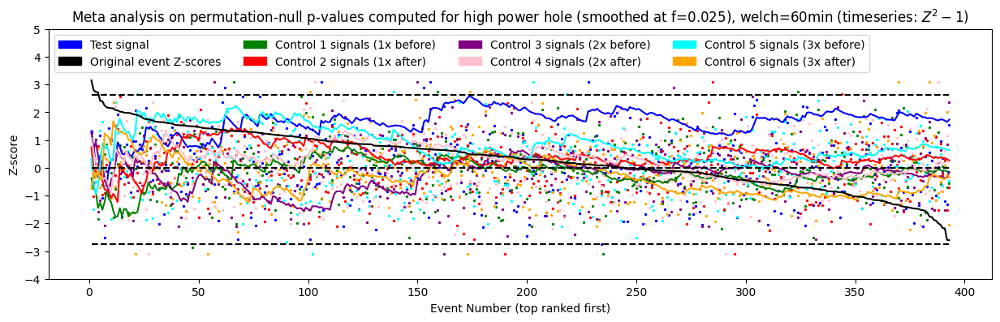

csm1 nperseg-30min_smooth-p025_min
Testing for positive meta-analysis z-scores:
test pval: 0.0938
control1 pval: 0.8868
control2 pval: 0.5368
control3 pval: 0.597
control4 pval: 0.5524
control5 pval: 0.1002
control6 pval: 0.5568
Testing for negative meta-analysis z-scores:
test pval: 0.946
control1 pval: 0.4476
control2 pval: 0.745
control3 pval: 0.18
control4 pval: 0.7714
control5 pval: 0.7018
control6 pval: 0.349
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.016688743229994037, pvalue=0.741543094996958)
control2: PearsonRResult(statistic=-0.03071550217860433, pvalue=0.5437747361182127)
control3: PearsonRResult(statistic=0.08680868396454634, pvalue=0.08567281033419416)
control4: PearsonRResult(statistic=-0.0265729637200516, pvalue=0.5994419125903885)
control5: PearsonRResult(statistic=-0.060334354891401626, pvalue=0.23272861500073802)
control6: PearsonRResult(statistic=0.013495281555028516, pvalue=0.7897051611638263)


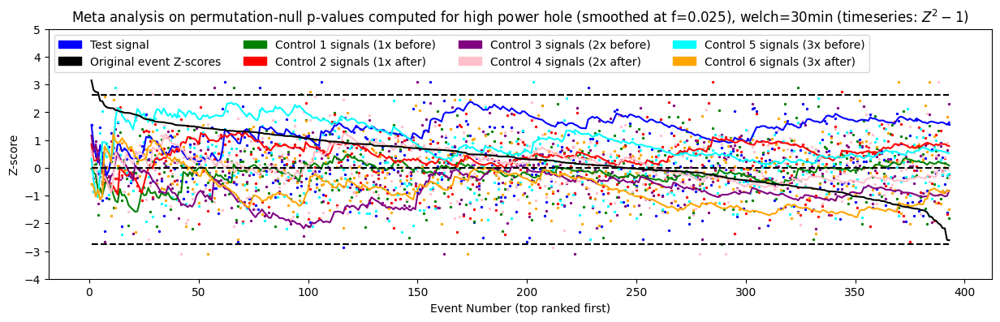

csm1 nperseg-NA_smooth-p03_max
Testing for positive meta-analysis z-scores:
test pval: 0.016
control1 pval: 0.9492
control2 pval: 0.769
control3 pval: 0.871
control4 pval: 0.2268
control5 pval: 0.7978
control6 pval: 0.5368
Testing for negative meta-analysis z-scores:
test pval: 0.8572
control1 pval: 0.1042
control2 pval: 0.7142
control3 pval: 0.1146
control4 pval: 0.1648
control5 pval: 0.5698
control6 pval: 0.3202
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.06039873486574793, pvalue=0.23222959318199665)
control2: PearsonRResult(statistic=0.004914442621691411, pvalue=0.9226348426034086)
control3: PearsonRResult(statistic=-0.03900684659485394, pvalue=0.4406411625696064)
control4: PearsonRResult(statistic=0.10147616232028289, pvalue=0.0443813564208429)
control5: PearsonRResult(statistic=0.035374025135147494, pvalue=0.4843971537888656)
control6: PearsonRResult(statistic=0.019192388979164237, pvalue=0.7044671106002378)


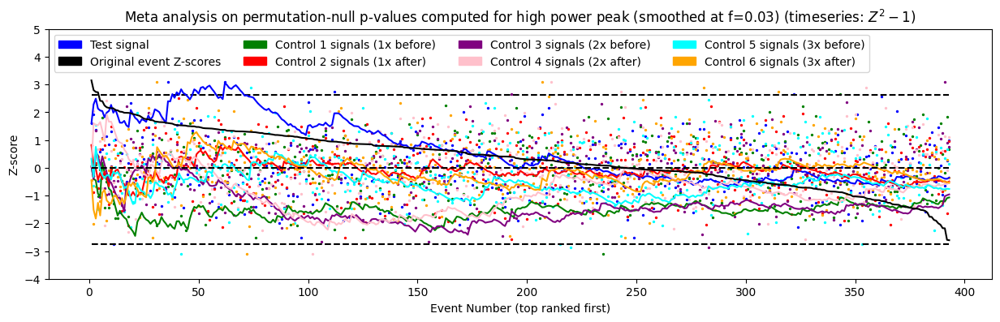

csm1 nperseg-60min_smooth-p03_max
Testing for positive meta-analysis z-scores:
test pval: 0.0354
control1 pval: 0.7864
control2 pval: 0.5758
control3 pval: 0.7322
control4 pval: 0.2382
control5 pval: 0.8772
control6 pval: 0.5432
Testing for negative meta-analysis z-scores:
test pval: 0.5856
control1 pval: 0.4188
control2 pval: 0.7858
control3 pval: 0.0952
control4 pval: 0.3082
control5 pval: 0.4708
control6 pval: 0.3114
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.07476780356548687, pvalue=0.1389895821664323)
control2: PearsonRResult(statistic=0.010076801184326266, pvalue=0.8421582853077629)
control3: PearsonRResult(statistic=-0.03499585820266543, pvalue=0.489083091148451)
control4: PearsonRResult(statistic=0.10338505987662472, pvalue=0.04051174819921655)
control5: PearsonRResult(statistic=-0.0006295669534474493, pvalue=0.9900738342687855)
control6: PearsonRResult(statistic=0.03703557956993268, pvalue=0.46409881362672495)


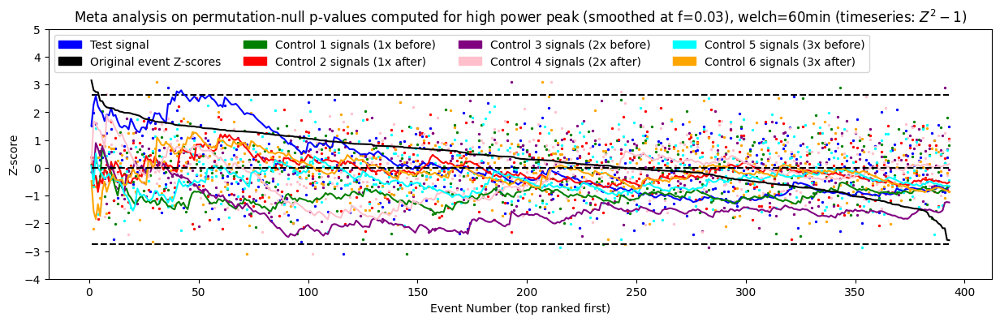

csm1 nperseg-30min_smooth-p03_max
Testing for positive meta-analysis z-scores:
test pval: 0.0276
control1 pval: 0.9136
control2 pval: 0.7696
control3 pval: 0.6992
control4 pval: 0.2776
control5 pval: 0.8438
control6 pval: 0.4024
Testing for negative meta-analysis z-scores:
test pval: 0.7682
control1 pval: 0.3034
control2 pval: 0.8052
control3 pval: 0.122
control4 pval: 0.28
control5 pval: 0.3454
control6 pval: 0.5126
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.05429754552693264, pvalue=0.2829255674043288)
control2: PearsonRResult(statistic=0.01185199693108064, pvalue=0.8148169077291834)
control3: PearsonRResult(statistic=-0.04884741638682756, pvalue=0.3341170314237312)
control4: PearsonRResult(statistic=0.049837866406876485, pvalue=0.32439688725202687)
control5: PearsonRResult(statistic=0.029598287561189755, pvalue=0.5585326921871541)
control6: PearsonRResult(statistic=-0.000983277930629897, pvalue=0.984497568251718)


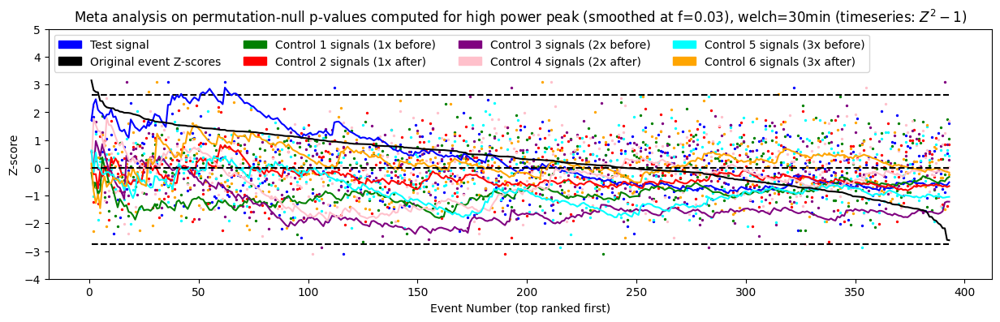

csm1 nperseg-NA_smooth-p03_min
Testing for positive meta-analysis z-scores:
test pval: 0.1786
control1 pval: 0.7738
control2 pval: 0.8182
control3 pval: 0.5672
control4 pval: 0.452
control5 pval: 0.2522
control6 pval: 0.2882
Testing for negative meta-analysis z-scores:
test pval: 0.53
control1 pval: 0.606
control2 pval: 0.5128
control3 pval: 0.4712
control4 pval: 0.469
control5 pval: 0.5936
control6 pval: 0.3852
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.016095640195561235, pvalue=0.7504182947900911)
control2: PearsonRResult(statistic=-0.024658839314799598, pvalue=0.6260036355547285)
control3: PearsonRResult(statistic=0.02233990353375943, pvalue=0.6588396627412557)
control4: PearsonRResult(statistic=0.03340849931216904, pvalue=0.5090148642694693)
control5: PearsonRResult(statistic=-0.0628048874081683, pvalue=0.21411881204986216)
control6: PearsonRResult(statistic=-0.025409236235902282, pvalue=0.6155303143398065)


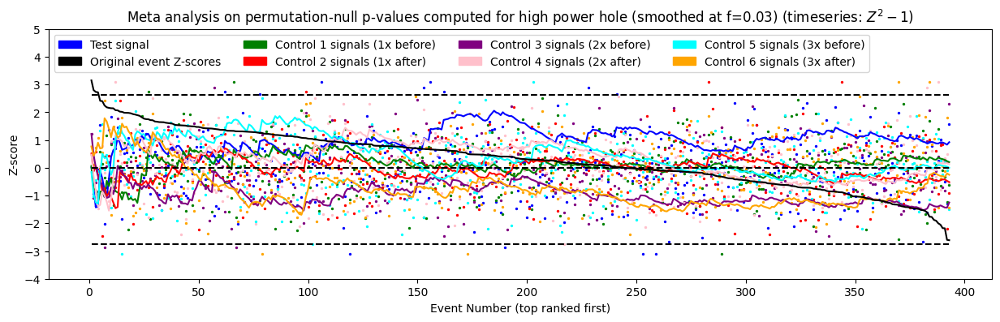

csm1 nperseg-60min_smooth-p03_min
Testing for positive meta-analysis z-scores:
test pval: 0.232
control1 pval: 0.423
control2 pval: 0.7198
control3 pval: 0.408
control4 pval: 0.4012
control5 pval: 0.5388
control6 pval: 0.4504
Testing for negative meta-analysis z-scores:
test pval: 0.7432
control1 pval: 0.6656
control2 pval: 0.612
control3 pval: 0.5498
control4 pval: 0.5152
control5 pval: 0.6384
control6 pval: 0.262
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.04096411043231937, pvalue=0.4180349685978655)
control2: PearsonRResult(statistic=0.014776038893767766, pvalue=0.7702816973195628)
control3: PearsonRResult(statistic=0.05864652781035682, pvalue=0.24608245484127333)
control4: PearsonRResult(statistic=-0.006541907635196827, pvalue=0.8971388262831651)
control5: PearsonRResult(statistic=-0.056001063249453364, pvalue=0.2680731254701265)
control6: PearsonRResult(statistic=-0.018632730863403182, pvalue=0.7126981089610079)


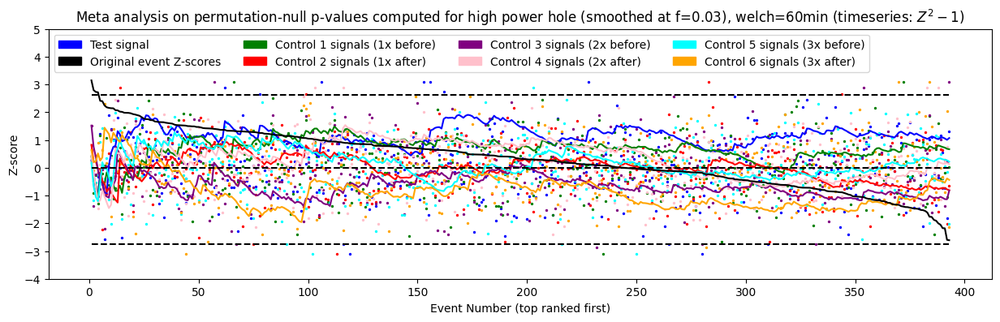

csm1 nperseg-30min_smooth-p03_min
Testing for positive meta-analysis z-scores:
test pval: 0.3158
control1 pval: 0.6646
control2 pval: 0.7966
control3 pval: 0.408
control4 pval: 0.3958
control5 pval: 0.244
control6 pval: 0.4482
Testing for negative meta-analysis z-scores:
test pval: 0.769
control1 pval: 0.8278
control2 pval: 0.522
control3 pval: 0.4862
control4 pval: 0.4574
control5 pval: 0.6684
control6 pval: 0.2842
Looking at correlation of test pvals with other pvals
control1: PearsonRResult(statistic=-0.03441594726024419, pvalue=0.496315867757754)
control2: PearsonRResult(statistic=-0.0017824075080014124, pvalue=0.9719024588854198)
control3: PearsonRResult(statistic=0.04489160404445809, pvalue=0.37478063038225734)
control4: PearsonRResult(statistic=0.007461362816745431, pvalue=0.8827794886969104)
control5: PearsonRResult(statistic=-0.055854421597539616, pvalue=0.26933025036367675)
control6: PearsonRResult(statistic=-0.018500764823738726, pvalue=0.7146438671795)


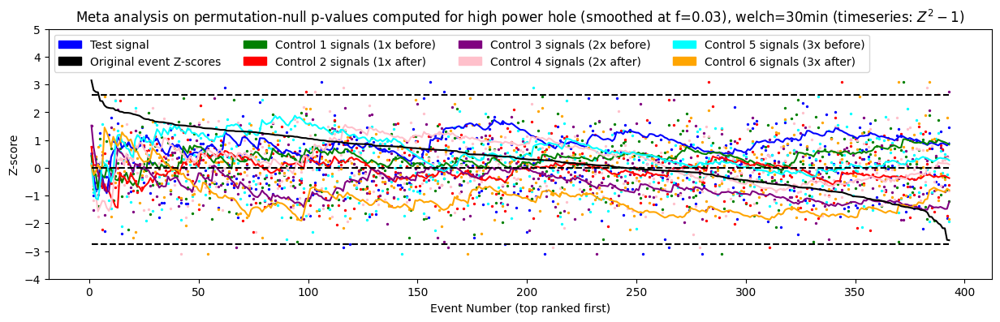

In [30]:
for signalname, signaldisplayname, pvals in [('csm1', '$Z^2 - 1$', csm1_psanalysis),
                                             #('compositez', 'Composite Z', compositez_psanalysis)
                                             ]:
  print(signalname)
  for metricname, metricdisplayname in [
                                        ('nperseg-NA_maxautocorr', 'max autocorrelation'),
                                        ('nperseg-60min_maxautocorr', 'max autocorrelation (welch=60min)'),
                                        ('nperseg-30min_maxautocorr', 'max autocorrelation (welch=30min)'),

                                        ('nperseg-NA_ef', 'power-weighted frequency'),
                                        ('nperseg-60min_ef', 'power-weighted frequency (welch=60min)'),
                                        ('nperseg-30min_ef', 'power-weighted frequency (welch=30min)'),

                                        ('nperseg-NA_maxd', 'Max Deviation From Uniform'),
                                        ('nperseg-60min_maxd', 'Max Deviation From Uniform (welch=60min)'),
                                        ('nperseg-30min_maxd', 'Max Deviation From Uniform (welch=30min)'),

                                        ('nperseg-NA_smooth-p0075_max', 'power peak (smoothed at f=0.0075)'),
                                        ('nperseg-60min_smooth-p0075_max', 'power peak (smoothed at f=0.0075, welch=60min)'),
                                        ('nperseg-30min_smooth-p0075_max', 'power peak (smoothed at f=0.0075, welch=30min)'),

                                        ('nperseg-NA_smooth-p0075_min', 'power hole (smoothed at f=0.0075)'),
                                        ('nperseg-60min_smooth-p0075_min', 'power hole (smoothed at f=0.0075, welch=60min)'),
                                        ('nperseg-30min_smooth-p0075_min', 'power hole (smoothed at f=0.0075, welch=30min)'),

                                        ('nperseg-NA_smooth-p01_max', 'power peak (smoothed at f=0.01)'),
                                        ('nperseg-60min_smooth-p01_max', 'power peak (smoothed at f=0.01, welch=60min)'),
                                        ('nperseg-30min_smooth-p01_max', 'power peak (smoothed at f=0.01, welch=30min)'),

                                        ('nperseg-NA_smooth-p01_min', 'power hole (smoothed at f=0.01)'),
                                        ('nperseg-60min_smooth-p01_min', 'power hole (smoothed at f=0.01, welch=60min)'),
                                        ('nperseg-30min_smooth-p01_min', 'power hole (smoothed at f=0.01, welch=30min)'),

                                        ('nperseg-NA_smooth-p0125_max', 'power peak (smoothed at f=0.0125)'),
                                        ('nperseg-60min_smooth-p0125_max', 'power peak (smoothed at f=0.0125), welch=60min'),
                                        ('nperseg-30min_smooth-p0125_max', 'power peak (smoothed at f=0.0125), welch=30min'),

                                        ('nperseg-NA_smooth-p0125_min', 'power hole (smoothed at f=0.0125)'),
                                        ('nperseg-60min_smooth-p0125_min', 'power hole (smoothed at f=0.0125), welch=60min'),
                                        ('nperseg-30min_smooth-p0125_min', 'power hole (smoothed at f=0.0125), welch=30min'),

                                        ('nperseg-NA_smooth-p025_max', 'power peak (smoothed at f=0.025)'),
                                        ('nperseg-60min_smooth-p025_max', 'power peak (smoothed at f=0.025), welch=60min'),
                                        ('nperseg-30min_smooth-p025_max', 'power peak (smoothed at f=0.025), welch=30min'),

                                        ('nperseg-NA_smooth-p025_min', 'power hole (smoothed at f=0.025)'),
                                        ('nperseg-60min_smooth-p025_min', 'power hole (smoothed at f=0.025), welch=60min'),
                                        ('nperseg-30min_smooth-p025_min', 'power hole (smoothed at f=0.025), welch=30min'),

                                        ('nperseg-NA_smooth-p03_max', 'power peak (smoothed at f=0.03)'),
                                        ('nperseg-60min_smooth-p03_max', 'power peak (smoothed at f=0.03), welch=60min'),
                                        ('nperseg-30min_smooth-p03_max', 'power peak (smoothed at f=0.03), welch=30min'),

                                        ('nperseg-NA_smooth-p03_min', 'power hole (smoothed at f=0.03)'),
                                        ('nperseg-60min_smooth-p03_min', 'power hole (smoothed at f=0.03), welch=60min'),
                                        ('nperseg-30min_smooth-p03_min', 'power hole (smoothed at f=0.03), welch=30min'),

                                        ]:
    print(signalname,metricname)
    make_meta_trend_plot(
      "Meta analysis on permutation-null p-values computed for high "
        +metricdisplayname+" (timeseries: "+signaldisplayname+")",
      test_pvals=np.array([x["pval_"+metricname] for x in pvals["test"]]),
      control1_pvals=np.array([x["pval_"+metricname] for x in pvals["control1"]]),
      control2_pvals=np.array([x["pval_"+metricname] for x in pvals["control2"]]),
      control3_pvals=np.array([x["pval_"+metricname] for x in pvals["control3"]]),
      control4_pvals=np.array([x["pval_"+metricname] for x in pvals["control4"]]),
      control5_pvals=np.array([x["pval_"+metricname] for x in pvals["control5"]]),
      control6_pvals=np.array([x["pval_"+metricname] for x in pvals["control6"]]),
      savefilename=signalname+"_"+metricname)
    #display(Image("analysis/metapval_"+signalname+"_"+metricname+".png"))



In [ ]:
%matplotlib inline
plt.figure(figsize=(10,4))
_, bins, _ = plt.hist([x["peak_freqs"]['0.0125'] for x in pvals_csm1["test"]],
                      bins=np.linspace(0,0.5,50), color="blue", alpha=0.33)
plt.hist([x["peak_freqs"]['0.0125'] for x in pvals_csm1["control1"]],
         bins=np.linspace(0,0.5,50), color="green", alpha=0.33)
plt.hist([x["peak_freqs"]['0.0125'] for x in pvals_csm1["control2"]],
         bins=np.linspace(0,0.5,50), color="red", alpha=0.33)
plt.legend(handles=[mpatches.Patch(color='blue', label='Test signal', alpha=0.33),
                    mpatches.Patch(color='green', label='Control 1 signals (before)', alpha=0.33),
                    mpatches.Patch(color='red', label='Control 2 signals (after)', alpha=0.33)],
             loc="upper left")
plt.title("Distribution of Frequency Peak in Power Spectrum of $Z^2 - 1$ signal (smoothing=0.0125)")
plt.xlabel("Frequency at Peak Value (50 bins)")
plt.ylabel("Number (out of "+str(len(pvals_csm1["test"]))+")")
plt.show()